<center><i>Łukasz Staniszewski, Łukasz Topolski</i></center>
<h1><center>Mini projekt 4 - SSNE - Generator obrazków</center></h1>

## Polecenie
Zadanie polega na stworzeniu modelu generatywnego, który generował będzie nowe obrazki przedstawiające znaki drogowe. Zbiór danych ma strukturę zgodną z domyślnymi ustawieniami ImageFolderu. Znaki podzielone są na klasy, które można wykorzystywać do generowania próbek.
Zamiast predykcji konieczne jest zwrócenie przykładowycj 1000 wygenerowanych za pomocą stworzonej metody próbek.
- Wygenerowane obrazki należy zapisać w formie torchowego tensora (na cpu, po detach, czyli np. wykonując komendę torch.save(generated_imgs.cpu().detach(),"nazwa.pt")). Tensor zgodnie z konwencją powinien mieć wymiary [1000,3,32,32].

Ewaluacja:
- Wygenerowane obrazki porównywane będą do zbioru testowego za pomocą metryki Frechet Inception Distance. https://github.com/mseitzer/pytorch-fid
- W zbiorze testowym obrazki mają podobny rozkład klas jak w treningowym.
- Należy pamiętać o denormalizacji próbek.

## Przygotowania

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as Functional
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import SubsetRandomSampler
from sklearn.model_selection import train_test_split
from collections import Counter
from torchvision.utils import save_image
from pathlib import Path

In [7]:
torch.cuda.set_device(0)
device = torch.device("cuda")
torch.cuda.is_available()

True

In [8]:
if torch.cuda.is_available():
    torch.cuda.manual_seed(500)
    torch.cuda.manual_seed_all(500)

torch.manual_seed(500)

torch.backends.cudnn.determinstic = True
torch.backends.cudnn.benchmark = False

## Zbiór danych

Normalizacja wykonywana będzie na statystykach zebranych bezpośrednio na zbiorze. Do jej zebrania powstała funkcja count_dataset_stats.

In [9]:
def count_dataset_stats(inp_dataset: torchvision.datasets.ImageFolder, n_channels: int = 3, batch_size: int=32) -> tuple[
    list, list]:
    """
    Function counts mean and standard deviation for each channel in dataset
    :param inp_dataset: dataset to count stats on
    :param n_channels: number of channels in dataset
    :param batch_size: size of batch in calculations
    :return:
        means - list of means for each channel
        stds - list of standard deviations for each channel
    """
    inp_dataloader = torch.utils.data.DataLoader(inp_dataset, batch_size=batch_size, shuffle=False)
    sums_sq = [0.0, 0.0, 0.0]
    stds = [0.0, 0.0, 0.0]
    means = [0.0, 0.0, 0.0]
    counts = [0.0, 0.0, 0.0]
    sums = [0.0, 0.0, 0.0]
    for index, data in enumerate(inp_dataloader):
        data_img = data[0]
        for ch_ind in range(n_channels):
            data_img_ch = data_img[:, ch_ind]
            counts[ch_ind] += np.prod(data_img_ch.shape)
            sums[ch_ind] += data_img_ch.sum()
    for ch_ind in range(n_channels):
        means[ch_ind] = sums[ch_ind] / counts[ch_ind]
    for index, data in enumerate(inp_dataloader):
        data_img = data[0]
        for ch_ind in range(n_channels):
            data_img_ch = data_img[:, ch_ind]
            sums_sq[ch_ind] += ((data_img_ch - means[ch_ind])**2).sum()
    for ch_ind in range(n_channels):
        stds[ch_ind] = np.sqrt(sums_sq[ch_ind] / counts[ch_ind]).item()
        means[ch_ind] = means[ch_ind].item()
    return (means, stds)

In [10]:
dataset_not_normalized = torchvision.datasets.ImageFolder("data/", transform=transforms.ToTensor())

In [11]:
mean_dataset, stdd_dataset = count_dataset_stats(dataset_not_normalized)
print(f"Channels means: {mean_dataset}, channels stds: {stdd_dataset}")

Channels means: [0.31852805614471436, 0.29300791025161743, 0.30163708329200745], channels stds: [0.2762238681316376, 0.26541516184806824, 0.26857253909111023]


In [12]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(mean_dataset, stdd_dataset)]
)

Wydzielamy mały zbiór walidacyjny.

In [13]:
VALID_SIZE = 0.05
SEED = 500

In [14]:
full_dataset = torchvision.datasets.ImageFolder("data/", transform=transform)

train_indices, test_indices, _, _ = train_test_split(
    range(len(full_dataset)),
    full_dataset.targets,
    stratify=full_dataset.targets,
    test_size=VALID_SIZE,
    random_state=SEED
)

train_subset = torch.utils.data.Subset(full_dataset, train_indices)
valid_subset = torch.utils.data.Subset(full_dataset, test_indices)


In [15]:
BATCH_SIZE = 128
train_loader = torch.utils.data.DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_subset, batch_size=BATCH_SIZE, shuffle=True)

tensor([ 2,  4, 10, 26, 10, 38, 42, 13, 16, 11, 40, 36, 26,  2, 18, 18, 18, 10,
        13, 14, 13,  3,  8,  4, 16,  2, 31, 10,  3,  8,  8, 13,  9, 12,  2, 18,
        18, 23, 13,  5,  9,  8, 21,  9, 25,  4, 38, 18,  5,  2, 16, 32, 39, 14,
        20, 11, 12, 29,  4, 14,  5, 40, 34,  2, 38, 22, 33, 37, 14, 18, 21,  1,
        25, 12,  2, 27, 26, 38, 33, 38,  1, 39, 12, 10, 25, 39, 34, 34,  6, 32,
         2,  1, 26, 11, 15, 17,  3,  9, 16,  8,  4, 10,  9, 10, 10, 38, 18,  1,
        12, 23, 11, 33, 34,  7, 12, 12, 29, 31, 31,  4,  2,  0, 11,  7,  8, 38,
         7, 17])


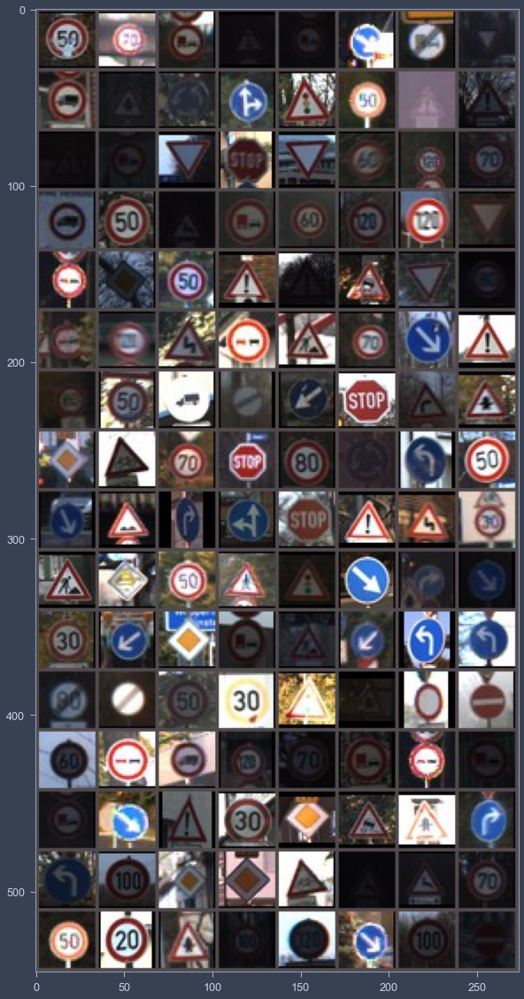

In [12]:
plt.figure(figsize=(10, 20))

def imshow(img):
    for ch in range(3):
        img[ch] = img[ch] * stdd_dataset[ch] + mean_dataset[ch]
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.show()

dataiter = iter(train_loader)
images, labels = dataiter.next()
print(labels)
imshow(torchvision.utils.make_grid(images))

tensor([ 1,  3,  6, 11, 25,  9, 38,  5,  3, 12, 40, 38, 18, 10, 35,  9,  1, 38,
         2,  4,  5, 12, 40,  3, 41, 34, 33, 13,  8, 18, 18,  9,  2,  8, 12,  2,
        24,  1, 22,  8, 34,  5,  1, 38,  9,  2, 37, 23,  2, 17, 27, 17, 38, 14,
        38, 18, 12, 13, 23, 12,  9, 25,  8, 11, 30, 35,  5, 33, 17, 13, 12,  7,
         7, 38,  2, 12, 25, 22, 31, 10, 31, 22, 35,  3,  1,  4,  2, 10,  8,  5,
        17, 21,  2, 15, 26, 21, 21, 28, 33,  2, 15,  1,  8, 33,  3,  5,  7, 36,
        38,  3, 18, 35, 26, 17, 31,  3, 33, 11,  4, 35,  2,  4, 13, 12,  2,  7,
        11, 17])


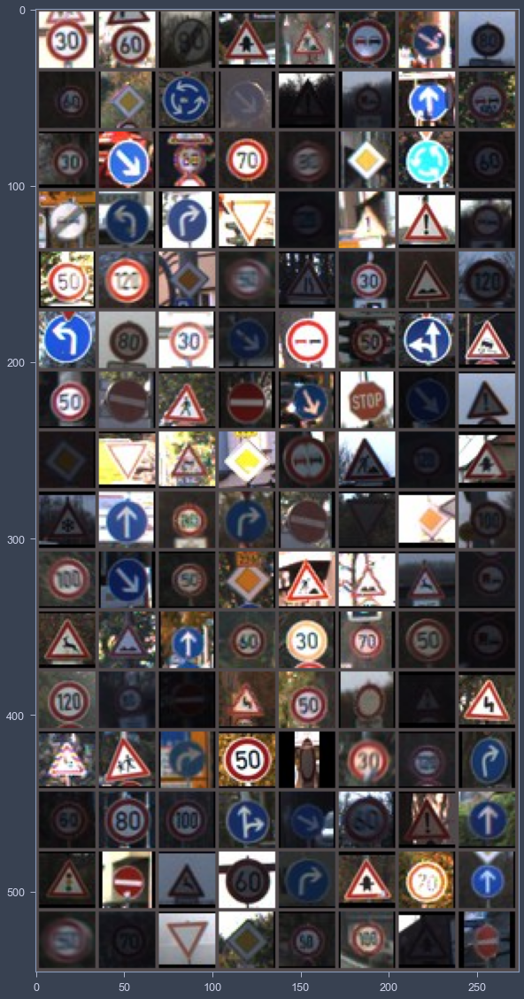

In [13]:
plt.figure(figsize=(10, 20))
dataiter = iter(valid_loader)
images, labels = dataiter.next()
print(labels)
imshow(torchvision.utils.make_grid(images))

## Model

In [16]:
numb_classess = len(full_dataset.classes)
numb_classess

43

In [17]:
class SignsEncoder(nn.Module):

    def __init__(self, latent_dim, n_of_classess):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=20, kernel_size=(2,2), stride=(2,2)) # 32x32 -> 16x16
        self.bn1 = nn.BatchNorm2d(20)

        self.conv2 = nn.Conv2d(in_channels=20, out_channels=50, kernel_size=(2,2), stride=(1,1)) # 16x16 -> 14x14
        self.bn2 = nn.BatchNorm2d(50)

        self.conv3 = nn.Conv2d(in_channels=50, out_channels=80, kernel_size=(2,2), stride=(2,2)) # 15x15 -> 7x7
        self.bn3 = nn.BatchNorm2d(80)

        self.conv4 = nn.Conv2d(in_channels=80, out_channels=128, kernel_size=(2,2)) # 7x7 -> 6x6
        self.bn4 = nn.BatchNorm2d(128)

        self.conv5 = nn.Conv2d(in_channels=128, out_channels=150, kernel_size=(2,2)) # 6x6 -> 5x5
        self.bn5 = nn.BatchNorm2d(150)

        self.fc_1 = nn.Linear(5*5*150 + n_of_classess, 2500)
        self.fc_2 = nn.Linear(2500, 1000)

        self.fc_mean = nn.Linear(1000, latent_dim)
        self.fc_var = nn.Linear(1000, latent_dim)


    def forward(self, x, class_onehot):
        x=self.bn1(Functional.relu(self.conv1(x)))
        x=self.bn2(Functional.relu(self.conv2(x)))
        x=self.bn3(Functional.relu(self.conv3(x)))
        x=self.bn4(Functional.relu(self.conv4(x)))
        x=self.bn5(Functional.relu(self.conv5(x)))
        x = torch.flatten(x, 1)
        x = torch.cat([x, class_onehot],dim=1)
        x = Functional.relu(self.fc_1(x))
        x = self.fc_2(x)
        mean = self.fc_mean(x)
        log_var = torch.tanh(self.fc_var(x))

        return mean, log_var

In [18]:
class SignsDecoder(nn.Module):

    def __init__(self, latent_dim, n_of_classess):
        super().__init__()
        self.linear = nn.Sequential(
            nn.Linear(latent_dim + n_of_classess, 5*5*16),
            nn.ReLU(),
            nn.Linear(5*5*16, 5*5*64)
        )
        # 5x5
        self.conv1 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3,3), padding=(1,1), stride=(1,1))
        self.bn1 = nn.BatchNorm2d(128)

        self.convt1 = nn.ConvTranspose2d(in_channels=128, out_channels=80, kernel_size=(2,2)) # 5x5 -> 6x6
        self.bnt1 = nn.BatchNorm2d(80)

        self.convt2 = nn.ConvTranspose2d(in_channels=80, out_channels=50, kernel_size=(2,2)) # 6x6 -> 7x7
        self.bnt2 = nn.BatchNorm2d(50)

        self.convt3 = nn.ConvTranspose2d(in_channels=50, out_channels=32, kernel_size=(2,2)) # 7x7 -> 8x8
        self.bnt3 = nn.BatchNorm2d(32)

        self.convt4 = nn.ConvTranspose2d(in_channels=32, out_channels=20, kernel_size=(2,2), stride=(2,2)) # 8x8 -> 16x16
        self.bnt4 = nn.BatchNorm2d(20)

        self.convt5 = nn.ConvTranspose2d(in_channels=20, out_channels=3, kernel_size=(2,2), stride=(2,2)) # 16x16 -> 32x32

        self.act_convt = nn.LeakyReLU(0.2)

    def forward(self, x, class_onehot):
        x = torch.cat([x, class_onehot], dim=1)
        x = self.linear(x)
        x = x.reshape(x.shape[0], 64, 5, 5)
        x = self.bn1(Functional.relu(self.conv1(x)))
        x = self.bnt1(self.act_convt(self.convt1(x)))
        x = self.bnt2(self.act_convt(self.convt2(x)))
        x = self.bnt3(self.act_convt(self.convt3(x)))
        x = self.bnt4(self.act_convt(self.convt4(x)))

        x_hat = self.convt5(x)
        return x_hat

In [19]:
class SignsVAE(nn.Module):

    def __init__(self, latent_dim, classess_size):
        super().__init__()
        self.encoder = SignsEncoder(latent_dim, classess_size)
        self.decoder = SignsDecoder(latent_dim, classess_size)

    def reparameterization(self, mean, std):
        z = torch.randn_like(mean).to(device) * std + mean
        return z

    def forward(self, x, class_onehot):
        mean, log_var = self.encoder(x, class_onehot)
        z = self.reparameterization(mean, torch.exp(0.5*log_var))
        x_hat = self.decoder(z, class_onehot)
        return x_hat, mean, log_var

In [20]:
def vae_loss_function(x, x_hat, mean, log_var):
    # print(f"LOG VAR: {log_var}")
    reproduction_loss = nn.functional.mse_loss(x_hat, x, reduction='mean')
    # print(f"REPRO LOSS: {reproduction_loss}")
    KLD = -0.5 *torch.sum(1+log_var - mean.pow(2) - log_var.exp())
    # print(f"KLD LOSS: {KLD}")
    return reproduction_loss + KLD

## Uczenie

W ramach zadania wykonaliśmy sprawdzenie działania modelu w zależności od takich hiperparametrów (rozmiar przestrzeni ukrytej, learning rate):
- (128, 0.0001), (128, 0.001), (128, 0.01), (128, 0.1);
- (64, 0.0001), (64, 0.001), (64, 0.01), (64, 0.1);
- (32, 0.0001), (32, 0.001), (32, 0.01), (32, 0.1);
- (256, 0.0001), (256, 0.001), (256, 0.01), (256, 0.1);
- (512, 0.0001), (512, 0.001), (512, 0.01), (512, 0.1).

Ze względu na to, że zbyt dużo miejsca zajmowałby plik jupytera, wybralismy naszym zdaniem najlepsze generacje, i je nauczylismy na większej liczbie epok.

In [21]:
tens_mean = torch.Tensor(mean_dataset)
tens_std = torch.Tensor(stdd_dataset)
denormalize = transforms.Normalize((-1 * tens_mean / tens_std).tolist(), (1.0 / tens_std).tolist())

In [22]:
h_params = [(128,0.001), (64,0.01), (64, 0.001), (64, 0.1),(256, 0.001), (256, 0.01), (512, 0.1)]

In [32]:
def validate_vae_training(vae_model, vae_optimizer, vae_train_loader, vae_valid_loader, vae_scheduler,
                              test_fixed_noise, test_fixed_labels_one_hot, test_fixed_labels, latent_size, num_epochs=81):
    for epoch in range(num_epochs):
        losses_epoch = []
        for x, y in iter(vae_train_loader):
            x = x.to(device)
            y = Functional.one_hot(y, numb_classess).to(device).float()
            out, means, log_var = vae_model(x, y)
            loss = vae_loss_function(x, out, means, log_var)
            losses_epoch.append(loss.item())
            loss.backward()
            vae_optimizer.step()
            vae_optimizer.zero_grad()
        L1_list = []
        with torch.no_grad():
            for x, y in iter(vae_valid_loader):
                x = x.to(device)
                y = Functional.one_hot(y, numb_classess).to(device).float()
                out, _, _ = vae_model(x, y)
                L1_list.append(torch.mean(torch.abs(out - x)).item())
            print(f"Epoch {epoch} loss {np.mean(np.array(losses_epoch))}, test L1 = {np.mean(L1_list)}")
            if epoch % 10 == 0:
                print(f"{test_fixed_labels=}")
                fake_gens = vae_model.decoder(test_fixed_noise[:,:latent_size], test_fixed_labels_one_hot).detach().cpu()
                # denormalize(fake_gens)
                grid = torchvision.utils.make_grid(fake_gens)
                grid = grid.permute(1, 2, 0)
                plt.figure(figsize=(10, 10))
                plt.title(f"Generations")
                plt.imshow(grid)
                plt.axis('off')
                plt.show()

        vae_scheduler.step()


In [33]:
N_OF_CLASSESS = numb_classess
val_fixed_noise = torch.randn(32, 512, device=device)
val_fixed_labels = next(iter(train_loader))[1]
val_fixed_labels = val_fixed_labels[:32].to(device)
val_fixed_labels_one_hot = Functional.one_hot(val_fixed_labels, N_OF_CLASSESS).float()

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=128 | LR=0.001
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 40.69937824424599, test L1 = 0.7497267015278339
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


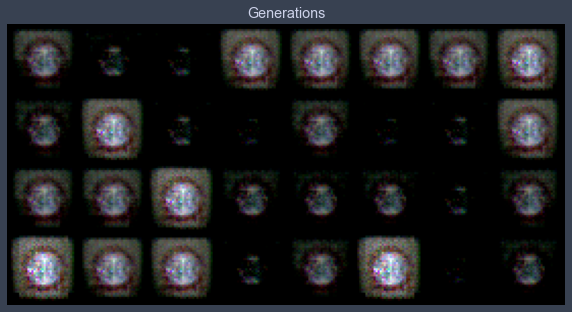

Epoch 1 loss 0.9474597700273049, test L1 = 0.7364625781774521
Epoch 2 loss 0.9221145774900299, test L1 = 0.7322222962975502
Epoch 3 loss 0.8828403093560865, test L1 = 0.7283060923218727
Epoch 4 loss 0.8686925021233837, test L1 = 0.7164440751075745
Epoch 5 loss 0.8564880322344934, test L1 = 0.7187560573220253
Epoch 6 loss 0.85065126849204, test L1 = 0.7173024639487267
Epoch 7 loss 0.8472870979522102, test L1 = 0.714037723839283
Epoch 8 loss 0.8449725236270026, test L1 = 0.7144173718988895
Epoch 9 loss 0.8428342635279259, test L1 = 0.7090687565505505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 0.8417558944512069, test L1 = 0.7126208022236824
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


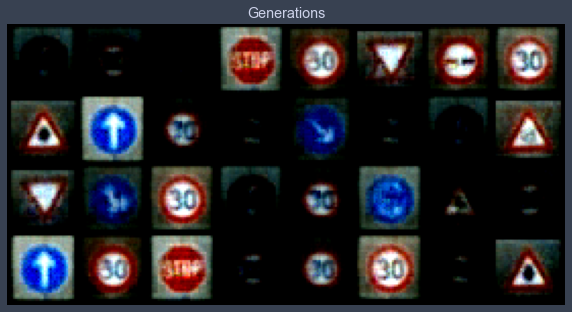

Epoch 11 loss 0.8410993875916472, test L1 = 0.7119153365492821
Epoch 12 loss 0.8390065732690477, test L1 = 0.7090437710285187
Epoch 13 loss 0.8395769059453223, test L1 = 0.7071256972849369
Epoch 14 loss 0.8381033642185512, test L1 = 0.7058994732797146
Epoch 15 loss 0.8381677333431965, test L1 = 0.7099680304527283
Epoch 16 loss 0.8372002289057597, test L1 = 0.7079982273280621
Epoch 17 loss 0.8366931334803605, test L1 = 0.7068733721971512
Epoch 18 loss 0.8366525502958658, test L1 = 0.7072573378682137
Epoch 19 loss 0.8358362224913135, test L1 = 0.7141219973564148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 0.8357989390691122, test L1 = 0.711138904094696
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


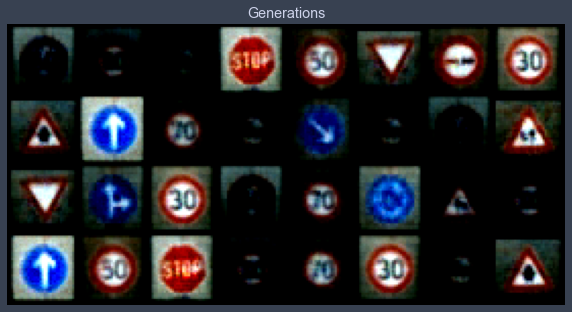

Epoch 21 loss 0.8354391316367998, test L1 = 0.7083552479743958
Epoch 22 loss 0.8350413482623411, test L1 = 0.7074002288281918
Epoch 23 loss 0.8345881352309918, test L1 = 0.7102622650563717
Epoch 24 loss 0.8349793555400625, test L1 = 0.7112722173333168
Epoch 25 loss 0.8341951263729239, test L1 = 0.7127349376678467
Epoch 26 loss 0.8340691078159818, test L1 = 0.7078034393489361
Epoch 27 loss 0.8345763656691587, test L1 = 0.7084818221628666
Epoch 28 loss 0.8344960179935206, test L1 = 0.7042489089071751
Epoch 29 loss 0.8336821731013531, test L1 = 0.7076936699450016


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 0.8334406184166977, test L1 = 0.7118951044976711
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


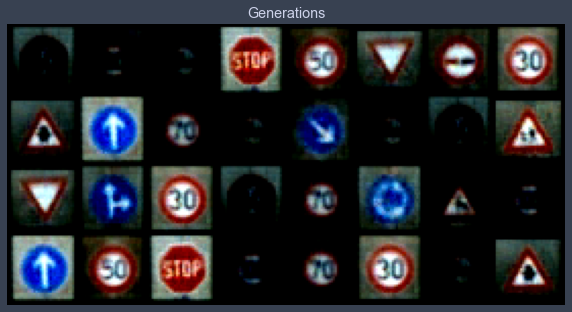

Epoch 31 loss 0.8334284408395642, test L1 = 0.7052585706114769
Epoch 32 loss 0.8329737954532977, test L1 = 0.7114707715809345
Epoch 33 loss 0.8334410587946574, test L1 = 0.7083111368119717
Epoch 34 loss 0.8331881884447078, test L1 = 0.7090266868472099
Epoch 35 loss 0.8329755086259744, test L1 = 0.7040753215551376
Epoch 36 loss 28136.06537825156, test L1 = 0.7180449403822422
Epoch 37 loss 27815.67061877087, test L1 = 0.7063721641898155
Epoch 38 loss 95.27103845360352, test L1 = 0.7045321390032768
Epoch 39 loss 13.503481012644228, test L1 = 0.70845727622509


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 10.952188254631672, test L1 = 0.7042070962488651
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


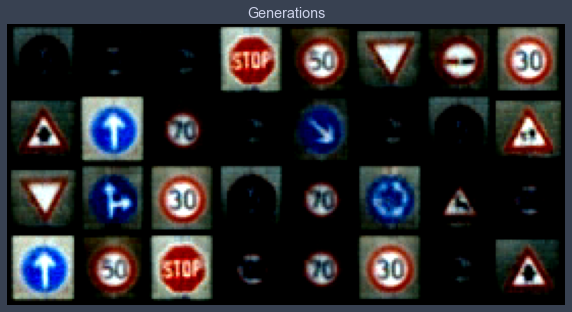

Epoch 41 loss 8.166156268406569, test L1 = 0.7077380679547787
Epoch 42 loss 7.353059813943515, test L1 = 0.7083371616899967
Epoch 43 loss 12.52932317580554, test L1 = 0.705980934202671
Epoch 44 loss 3.6870072703181265, test L1 = 0.7065467797219753
Epoch 45 loss 2.6000534693400064, test L1 = 0.7058496549725533
Epoch 46 loss 2.4672297124600493, test L1 = 0.7064393050968647
Epoch 47 loss 2.160757337444017, test L1 = 0.7044901736080647
Epoch 48 loss 5.129279429355438, test L1 = 0.7033058255910873
Epoch 49 loss 2.4797342730961303, test L1 = 0.703442245721817


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 1.6412608392050176, test L1 = 0.7047729082405567
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


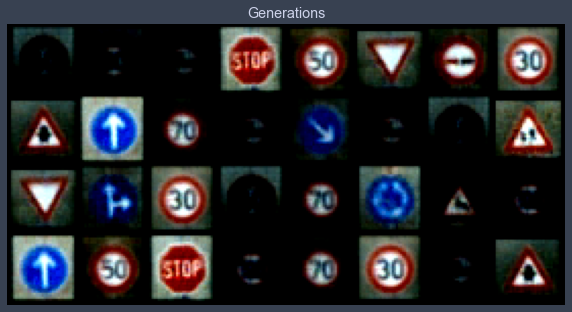

Epoch 51 loss 1.536394485698123, test L1 = 0.7066741436719894
Epoch 52 loss 2.673072159085487, test L1 = 0.7030317895114422
Epoch 53 loss 2.2766052615601584, test L1 = 0.7065391764044762
Epoch 54 loss 2.033255910750517, test L1 = 0.7095109149813652
Epoch 55 loss 2.0821311135881957, test L1 = 0.7096610479056835
Epoch 56 loss 1.5862685163406163, test L1 = 0.7058286666870117
Epoch 57 loss 1.6397375994941212, test L1 = 0.7089051455259323
Epoch 58 loss 1.178502501491009, test L1 = 0.7087110504508018
Epoch 59 loss 1.305782778771063, test L1 = 0.7067529298365116


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 0.9172519660487617, test L1 = 0.7052142582833767
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


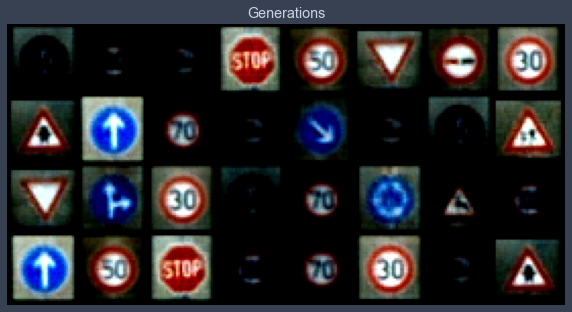

Epoch 61 loss 1.3011104753336955, test L1 = 0.7082424238324165
Epoch 62 loss 0.9691912843189698, test L1 = 0.70381074026227
Epoch 63 loss 1.0001590702541916, test L1 = 0.706192672252655
Epoch 64 loss 0.9205077640789071, test L1 = 0.701588299125433
Epoch 65 loss 0.8874240701960534, test L1 = 0.7108081355690956
Epoch 66 loss 1.0319665146037884, test L1 = 0.7054960243403912
Epoch 67 loss 0.9054956647128993, test L1 = 0.7030116207897663
Epoch 68 loss 0.8597979785240802, test L1 = 0.7098378986120224
Epoch 69 loss 0.8375600773034636, test L1 = 0.7062780074775219


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 0.8999022286372496, test L1 = 0.7057449854910374
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


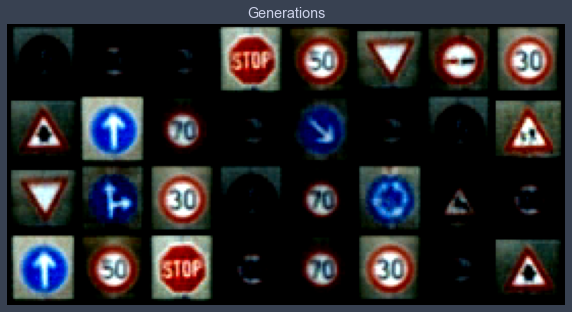

Epoch 71 loss 0.8616579070533674, test L1 = 0.7053385525941849
Epoch 72 loss 0.870614532547718, test L1 = 0.7097691558301449
Epoch 73 loss 0.8588528934213304, test L1 = 0.7030015662312508
Epoch 74 loss 0.8593606399916291, test L1 = 0.7043676935136318
Epoch 75 loss 1.1045631729450422, test L1 = 0.7037507556378841
Epoch 76 loss 5.7540968769194745, test L1 = 0.7034075744450092
Epoch 77 loss 0.9364685971302675, test L1 = 0.7060512602329254
Epoch 78 loss 0.90368039952111, test L1 = 0.7078330107033253
Epoch 79 loss 0.8321081981626163, test L1 = 0.7050366550683975


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 3.2127453281297718, test L1 = 0.7088210918009281
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


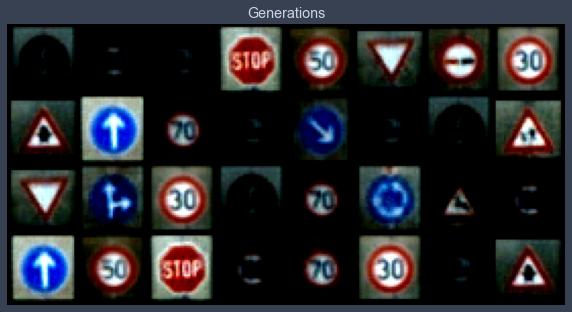







~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=64 | LR=0.01
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 8761443.676020881, test L1 = 0.7404541037976742
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


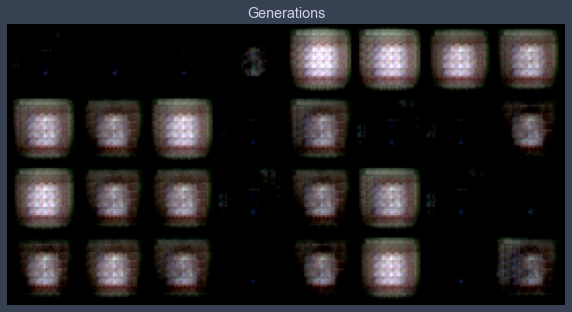

Epoch 1 loss 4581.028293675164, test L1 = 0.7393298670649529
Epoch 2 loss 759.0590334757907, test L1 = 0.7205982059240341
Epoch 3 loss 413.4147860602415, test L1 = 0.7177208475768566
Epoch 4 loss 308.8307489611439, test L1 = 0.702753696590662
Epoch 5 loss 145.59791205756852, test L1 = 0.7096449136734009
Epoch 6 loss 114.78789123390958, test L1 = 0.712713573127985
Epoch 7 loss 175.67308796885908, test L1 = 0.7100963816046715
Epoch 8 loss 109.94013525448304, test L1 = 0.7109926268458366
Epoch 9 loss 46.93430653142765, test L1 = 0.715712808072567


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 37.61484365446871, test L1 = 0.7104365304112434
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


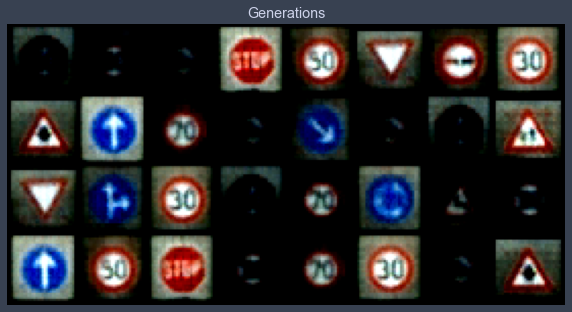

Epoch 11 loss 34.755673676421964, test L1 = 0.7039370574057102
Epoch 12 loss 34.2545980825457, test L1 = 0.7149929776787758
Epoch 13 loss 25.849142801311007, test L1 = 0.7058989331126213
Epoch 14 loss 19.538243248700276, test L1 = 0.705402810126543
Epoch 15 loss 20.154381936358423, test L1 = 0.711484357714653
Epoch 16 loss 18.318757568233202, test L1 = 0.7044114544987679
Epoch 17 loss 10.878855719189463, test L1 = 0.7015226595103741
Epoch 18 loss 10.256155878203021, test L1 = 0.7120428867638111
Epoch 19 loss 9.581207333356653, test L1 = 0.7030257247388363


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 7.815210831534002, test L1 = 0.7070300132036209
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


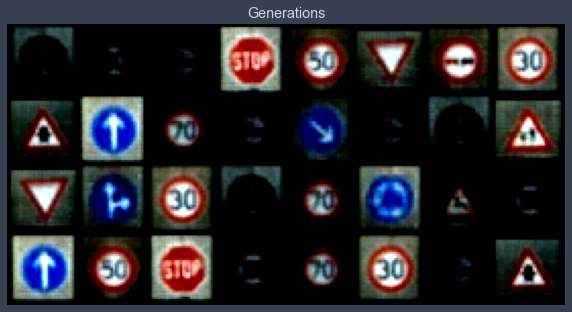

Epoch 21 loss 5.67746407490006, test L1 = 0.7146950177848339
Epoch 22 loss 5.51948744058609, test L1 = 0.707719299942255
Epoch 23 loss 5.498283981047955, test L1 = 0.7010336592793465
Epoch 24 loss 4.6531845390591835, test L1 = 0.7088845632970333
Epoch 25 loss 3.569714376402065, test L1 = 0.6988860927522182
Epoch 26 loss 3.5242283499937286, test L1 = 0.7152174077928066
Epoch 27 loss 2.532776069804975, test L1 = 0.7139455229043961
Epoch 28 loss 1.650211484161849, test L1 = 0.7056621797382832
Epoch 29 loss 1.6631280234998853, test L1 = 0.704293716698885


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 1.5570376546112532, test L1 = 0.7032883949577808
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


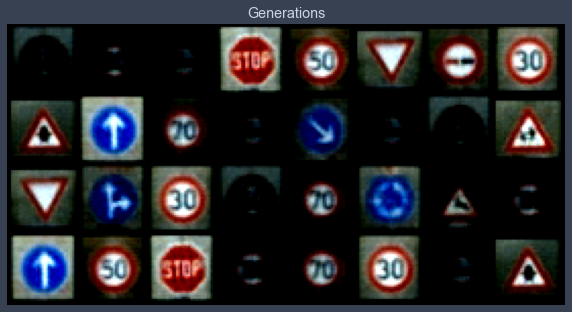

Epoch 31 loss 1.1926805243869008, test L1 = 0.7134370133280754
Epoch 32 loss 1.032528861486625, test L1 = 0.7000111453235149
Epoch 33 loss 1.053204245378881, test L1 = 0.7106855325400829
Epoch 34 loss 1.0723642399630595, test L1 = 0.712014976888895
Epoch 35 loss 0.9303672166214776, test L1 = 0.7015279158949852
Epoch 36 loss 0.8908466797104406, test L1 = 0.7099716402590275
Epoch 37 loss 2.3833453247637273, test L1 = 0.7174338176846504
Epoch 38 loss 0.8756988003491536, test L1 = 0.7046056911349297
Epoch 39 loss 0.8545277819191057, test L1 = 0.7119181826710701


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 0.9042579865537558, test L1 = 0.7074972949922085
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


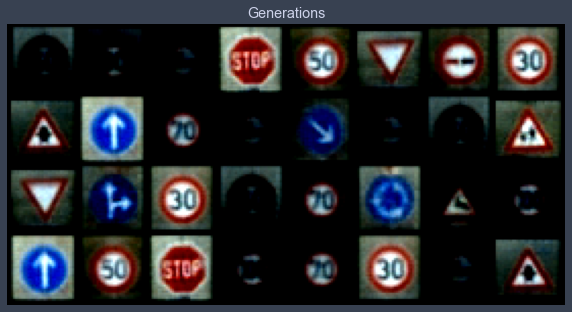

Epoch 41 loss 0.9348760730622151, test L1 = 0.7063595987856388
Epoch 42 loss 0.8457441479479734, test L1 = 0.709404967725277
Epoch 43 loss 0.910270504115783, test L1 = 0.7162618339061737
Epoch 44 loss 0.9579271784762746, test L1 = 0.7047848217189312
Epoch 45 loss 0.8560367105752742, test L1 = 0.7081315740942955
Epoch 46 loss 57579439.28907375, test L1 = 0.8602833673357964
Epoch 47 loss 2070199499.8049393, test L1 = 0.7023526430130005
Epoch 48 loss 20611.149484536083, test L1 = 0.6977600678801537
Epoch 49 loss 11659.7268511061, test L1 = 0.7049469761550426


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 8394.931078514282, test L1 = 0.706962488591671
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


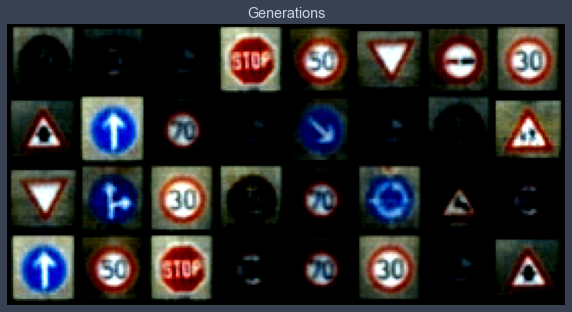

Epoch 51 loss 6683.934971340743, test L1 = 0.7011413127183914
Epoch 52 loss 5710.323505624463, test L1 = 0.7036795131862164
Epoch 53 loss 4724.867893074796, test L1 = 0.7121852561831474
Epoch 54 loss 3734.6115512913443, test L1 = 0.7209639549255371
Epoch 55 loss 6016.098426006094, test L1 = 0.7076143212616444
Epoch 56 loss 2659.767734173647, test L1 = 0.7041227221488953
Epoch 57 loss 2415.3195536505314, test L1 = 0.6984189301729202
Epoch 58 loss 2204.916456504376, test L1 = 0.6972063258290291
Epoch 59 loss 1854.3502633530659, test L1 = 0.7034304067492485


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 1834.0268932224549, test L1 = 0.7087208963930607
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


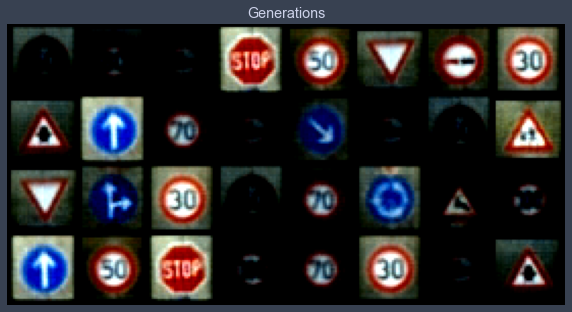

Epoch 61 loss 1549.446573054258, test L1 = 0.705123744904995
Epoch 62 loss 9479.953830994282, test L1 = 0.7041485793888569
Epoch 63 loss 1430.8681477025611, test L1 = 0.6983413025736809
Epoch 64 loss 1405.1477025612114, test L1 = 0.7021988220512867
Epoch 65 loss 1374.8110649397283, test L1 = 0.7055652476847172
Epoch 66 loss 1351.4484011725463, test L1 = 0.7041252963244915
Epoch 67 loss 1297.507562906062, test L1 = 0.7084364667534828
Epoch 68 loss 1293.4225155545264, test L1 = 0.7064481563866138
Epoch 69 loss 1243.3357323715368, test L1 = 0.715448398143053


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 1264.5865658894438, test L1 = 0.7098528183996677
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


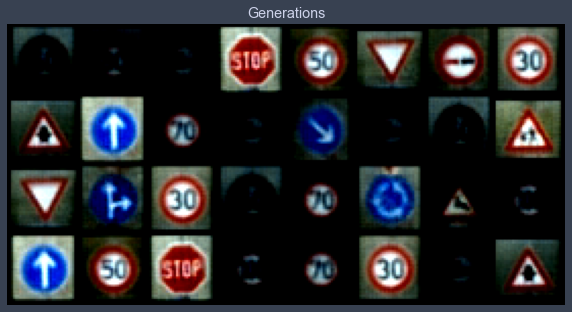

Epoch 71 loss 1249.170192862704, test L1 = 0.7013267874717712
Epoch 72 loss 1227.5804888014122, test L1 = 0.703566137701273
Epoch 73 loss 1229.225466384101, test L1 = 0.6996750719845295
Epoch 74 loss 1205.5751143517773, test L1 = 0.7016171589493752
Epoch 75 loss 1814.4456967488188, test L1 = 0.7082566171884537
Epoch 76 loss 1222.6286612704039, test L1 = 0.7081967778503895
Epoch 77 loss 1221.8120230448615, test L1 = 0.7039052322506905
Epoch 78 loss 1199.1968415250483, test L1 = 0.7123666815459728
Epoch 79 loss 1201.132047777733, test L1 = 0.6994155012071133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 1198.1992258812554, test L1 = 0.7004155963659286
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


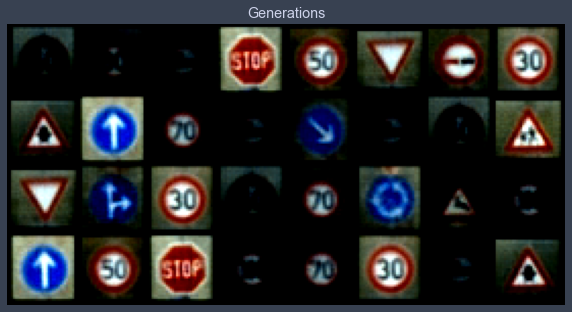







~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=64 | LR=0.001
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 32.799022826951806, test L1 = 0.7455113120377064
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


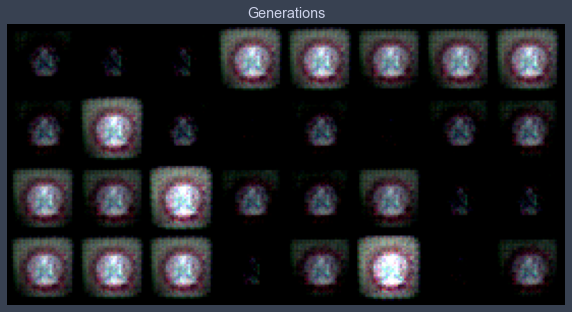

Epoch 1 loss 0.9624092490812347, test L1 = 0.7369699440896511
Epoch 2 loss 0.884419570673782, test L1 = 0.7306932248175144
Epoch 3 loss 0.8666019214387611, test L1 = 0.7218497395515442
Epoch 4 loss 0.8540913075515905, test L1 = 0.7125520221889019
Epoch 5 loss 0.8481165576226932, test L1 = 0.716365210711956
Epoch 6 loss 0.8454155659757528, test L1 = 0.7131973057985306
Epoch 7 loss 0.8428502201624343, test L1 = 0.7134045846760273
Epoch 8 loss 0.8410110774728441, test L1 = 0.7153787687420845
Epoch 9 loss 0.8394715540187875, test L1 = 0.7083304896950722


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 0.8386722626964661, test L1 = 0.7085673920810223
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


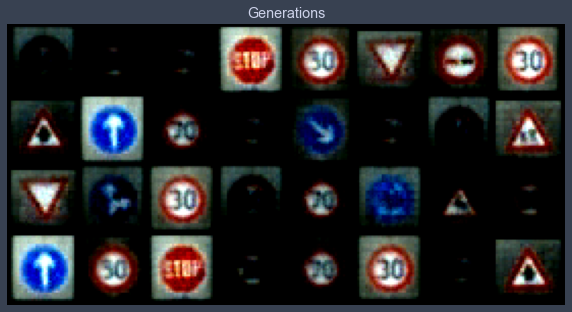

Epoch 11 loss 0.8374477538865867, test L1 = 0.7089069336652756
Epoch 12 loss 0.8368715807744318, test L1 = 0.7051413282752037
Epoch 13 loss 0.8366320716966059, test L1 = 0.7088369838893414
Epoch 14 loss 0.8363714736351853, test L1 = 0.7116153687238693
Epoch 15 loss 0.835495660599974, test L1 = 0.7126657851040363
Epoch 16 loss 0.83526496727442, test L1 = 0.7120021879673004
Epoch 17 loss 0.8349018129696142, test L1 = 0.7021174617111683
Epoch 18 loss 0.8348855513477653, test L1 = 0.7077249772846699
Epoch 19 loss 0.8348076376308691, test L1 = 0.7079859375953674


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 0.8342383905374717, test L1 = 0.707378551363945
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


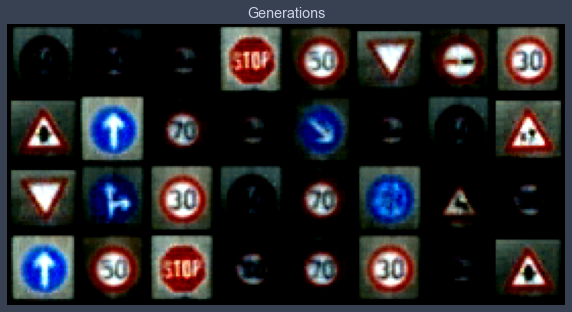

Epoch 21 loss 0.8344711149271411, test L1 = 0.7028592936694622
Epoch 22 loss 0.8340030281814104, test L1 = 0.7055373638868332
Epoch 23 loss 0.8337861737844461, test L1 = 0.7064659334719181
Epoch 24 loss 0.8334911764692196, test L1 = 0.7070185504853725
Epoch 25 loss 0.8336106010319031, test L1 = 0.7081390656530857
Epoch 26 loss 0.8337340109127084, test L1 = 0.7076037637889385
Epoch 27 loss 16241.883281719643, test L1 = 0.7358296066522598
Epoch 28 loss 7987.66289810483, test L1 = 0.7135131880640984
Epoch 29 loss 6.397926825837991, test L1 = 0.7058887220919132


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 3.15315746073051, test L1 = 0.7040516547858715
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


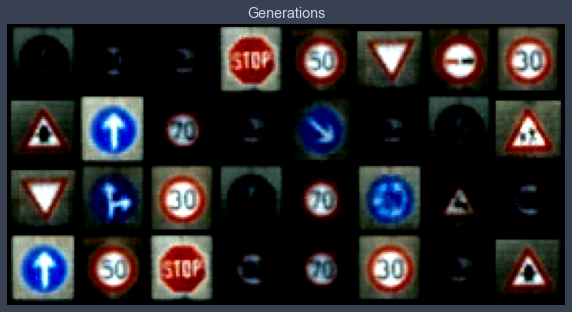

Epoch 31 loss 12.32544865006024, test L1 = 0.7101003974676132
Epoch 32 loss 2.1722443730560776, test L1 = 0.7079844437539577
Epoch 33 loss 1.892734136368401, test L1 = 0.7064924761652946
Epoch 34 loss 6.081991792134812, test L1 = 0.7074311524629593
Epoch 35 loss 2.605934036146734, test L1 = 0.7047009207308292
Epoch 36 loss 2.1043908563266505, test L1 = 0.706216000020504
Epoch 37 loss 1.4392479043645956, test L1 = 0.7025058306753635
Epoch 38 loss 0.9386648799955231, test L1 = 0.7075369581580162
Epoch 39 loss 0.9325330396698103, test L1 = 0.7027819789946079


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 0.8976997264062416, test L1 = 0.7066795825958252
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


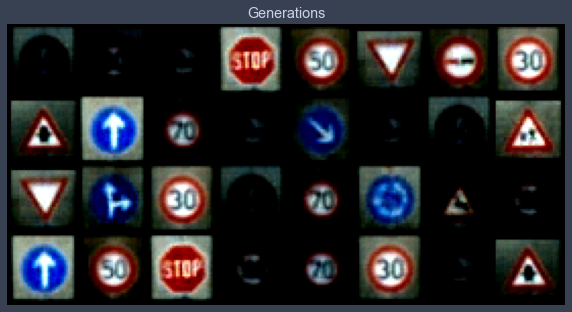

Epoch 41 loss 0.985305495893013, test L1 = 0.7065383866429329
Epoch 42 loss 1.20843276658009, test L1 = 0.7017907276749611
Epoch 43 loss 0.8843520222250948, test L1 = 0.7055410780012608
Epoch 44 loss 0.8617116667560696, test L1 = 0.7014810964465141
Epoch 45 loss 29.40707266801821, test L1 = 0.7049798034131527
Epoch 46 loss 14.202749601754126, test L1 = 0.7023417204618454
Epoch 47 loss 1.6274339214633011, test L1 = 0.7035804390907288
Epoch 48 loss 14.522943936262754, test L1 = 0.7086819037795067
Epoch 49 loss 1.5686133340052313, test L1 = 0.7092229314148426


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 501.6860049731543, test L1 = 0.7042628303170204
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


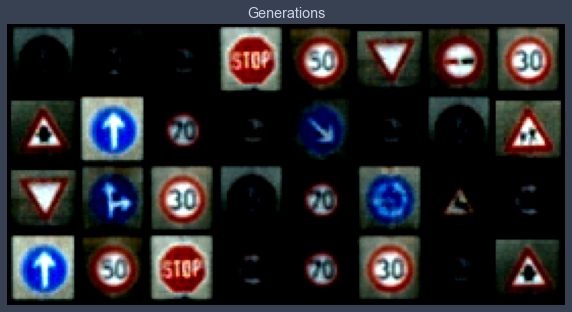

Epoch 51 loss 224.08699075933993, test L1 = 0.7014929763972759
Epoch 52 loss 62.722459814188, test L1 = 0.7056760787963867
Epoch 53 loss 5.557663245913909, test L1 = 0.7041797824203968
Epoch 54 loss 0.8585657833777752, test L1 = 0.7034446373581886
Epoch 55 loss 0.8616944928349498, test L1 = 0.7043429799377918
Epoch 56 loss 1.0471965953246833, test L1 = 0.7087679989635944
Epoch 57 loss 0.9066865646962038, test L1 = 0.7081195935606956
Epoch 58 loss 0.908358765017126, test L1 = 0.7061641588807106
Epoch 59 loss 1.4990928234513272, test L1 = 0.701048705726862


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 0.8363560382852849, test L1 = 0.7043436206877232
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


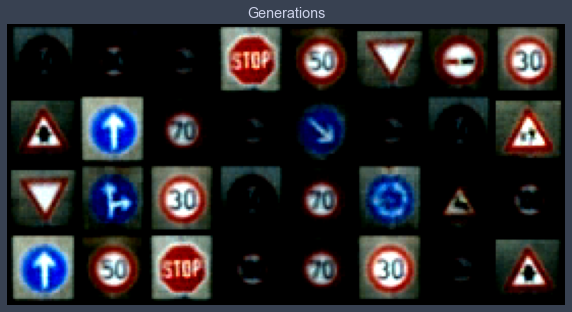

Epoch 61 loss 0.8339987210801377, test L1 = 0.7118756175041199
Epoch 62 loss 0.8357985736578191, test L1 = 0.706033319234848
Epoch 63 loss 0.841524688853431, test L1 = 0.7031815126538277
Epoch 64 loss 0.8322828194939393, test L1 = 0.7015394382178783
Epoch 65 loss 0.8666897733596592, test L1 = 0.7076621986925602
Epoch 66 loss 0.8336161266487488, test L1 = 0.7031732238829136
Epoch 67 loss 0.8827888007016526, test L1 = 0.7018125355243683
Epoch 68 loss 0.8809067150161848, test L1 = 0.7067867778241634
Epoch 69 loss 0.8308295275747162, test L1 = 0.702540185302496


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 0.8305692297896159, test L1 = 0.7117941938340664
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


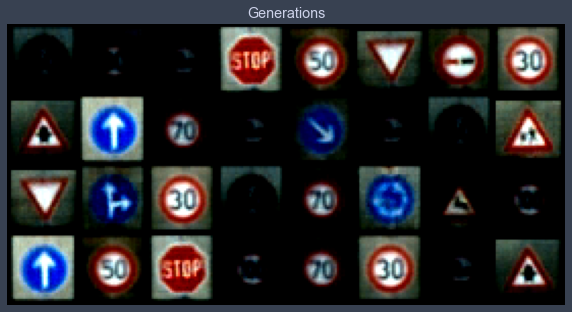

Epoch 71 loss 0.8306584153388374, test L1 = 0.70452531427145
Epoch 72 loss 0.8388212845497525, test L1 = 0.7049182914197445
Epoch 73 loss 0.8316931058860726, test L1 = 0.7061085850000381
Epoch 74 loss 0.8306896530885467, test L1 = 0.7082021459937096
Epoch 75 loss 0.8347714285260623, test L1 = 0.7023048102855682
Epoch 76 loss 0.8302576740582784, test L1 = 0.7018700167536736
Epoch 77 loss 0.8354588216522715, test L1 = 0.7045392356812954
Epoch 78 loss 0.8299774474294734, test L1 = 0.7055590525269508
Epoch 79 loss 0.8302316382988212, test L1 = 0.7059121653437614


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 1.0103003986922325, test L1 = 0.7050050348043442
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


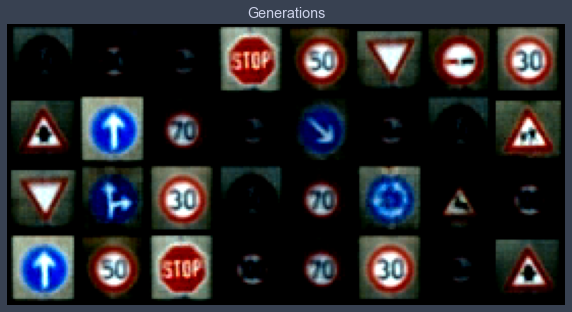







~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=64 | LR=0.1
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 13680247025205.342, test L1 = 0.7410259321331978
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


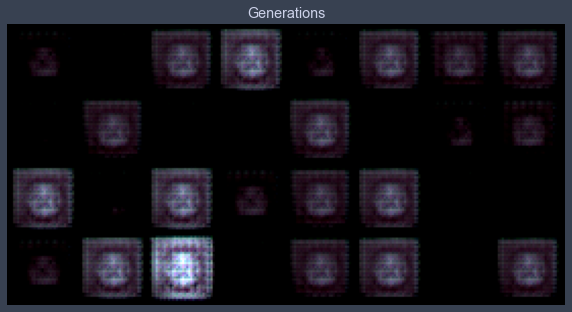

Epoch 1 loss 211023.66118986256, test L1 = 0.7533214017748833
Epoch 2 loss 188812.43309707905, test L1 = 0.7535266429185867
Epoch 3 loss 179024.235395189, test L1 = 0.7546806074678898
Epoch 4 loss 168954.04257946735, test L1 = 0.7497958391904831
Epoch 5 loss 157651.13815506874, test L1 = 0.735257513821125
Epoch 6 loss 145304.38890678695, test L1 = 0.7587530016899109
Epoch 7 loss 132164.3117482818, test L1 = 0.7338455803692341
Epoch 8 loss 118511.1110395189, test L1 = 0.7368454411625862
Epoch 9 loss 104663.48689862543, test L1 = 0.7418397627770901


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 90921.55884879726, test L1 = 0.7267400212585926
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


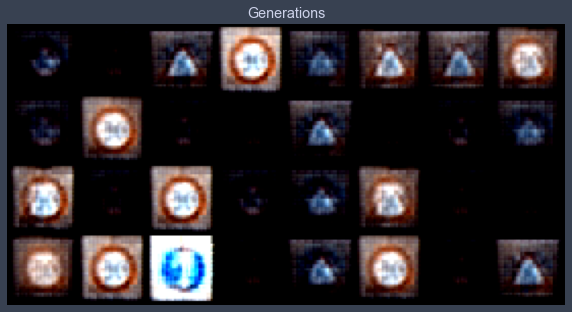

Epoch 11 loss 77653.04735824742, test L1 = 0.7473394758999348
Epoch 12 loss 65193.69951406787, test L1 = 0.7156458459794521
Epoch 13 loss 53771.53727716924, test L1 = 0.7191390879452229
Epoch 14 loss 43674.97544834622, test L1 = 0.7776935324072838
Epoch 15 loss 35011.407827265895, test L1 = 0.7276880741119385
Epoch 16 loss 27808.034686426116, test L1 = 0.727847695350647
Epoch 17 loss 22027.304237811426, test L1 = 0.7081830315291882
Epoch 18 loss 17469.97923042848, test L1 = 0.7306489571928978
Epoch 19 loss 13957.857354757303, test L1 = 0.7311134748160839


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 11283.307331937285, test L1 = 0.7367631606757641
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


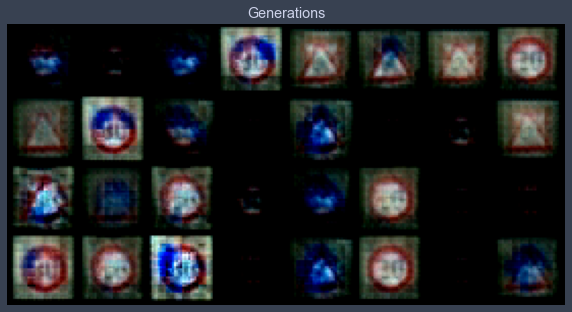

Epoch 21 loss 9211.757611146908, test L1 = 0.746660340577364
Epoch 22 loss 7588.672628396155, test L1 = 0.7290922291576862
Epoch 23 loss 6294.077881698347, test L1 = 0.7351621352136135
Epoch 24 loss 5242.162092595576, test L1 = 0.7253427617251873
Epoch 25 loss 4402.910304747906, test L1 = 0.7149519398808479
Epoch 26 loss 3749.007121187715, test L1 = 0.7098603919148445
Epoch 27 loss 3256.416560956293, test L1 = 0.7419802844524384
Epoch 28 loss 2899.299817272068, test L1 = 0.7211452722549438
Epoch 29 loss 2650.012222971703, test L1 = 0.7557035721838474


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 2481.48705047922, test L1 = 0.7286909036338329
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


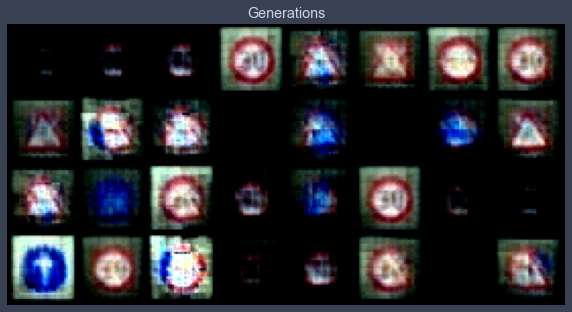

Epoch 31 loss 2369.958675633591, test L1 = 0.7272879481315613
Epoch 32 loss 2296.692126926278, test L1 = 0.6989268213510513
Epoch 33 loss 2248.3053410585803, test L1 = 0.7235127910971642
Epoch 34 loss 2216.0252907874246, test L1 = 0.7344958260655403
Epoch 35 loss 2194.404072869684, test L1 = 0.7016862817108631
Epoch 36 loss 2180.0625755074097, test L1 = 0.7021648176014423
Epoch 37 loss 2170.7940275316796, test L1 = 0.7186076864600182
Epoch 38 loss 2165.0353450185244, test L1 = 0.7341945916414261
Epoch 39 loss 2161.639156800365, test L1 = 0.7016743533313274


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 2159.757839347079, test L1 = 0.6831870451569557
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


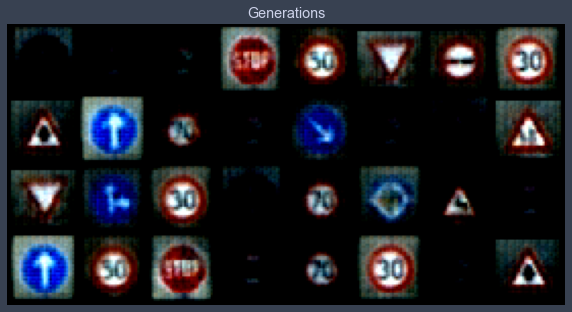

Epoch 41 loss 2158.7879273719395, test L1 = 0.715712159872055
Epoch 42 loss 2158.328877557184, test L1 = 0.6812605783343315
Epoch 43 loss 2158.1307620543384, test L1 = 0.6891619600355625
Epoch 44 loss 2158.0545205447274, test L1 = 0.7194075584411621
Epoch 45 loss 2158.0299923821412, test L1 = 0.7129972763359547
Epoch 46 loss 2158.0226539008804, test L1 = 0.6901301741600037
Epoch 47 loss 2158.020236824796, test L1 = 0.7011864222586155
Epoch 48 loss 2158.0224609375, test L1 = 0.7248967327177525
Epoch 49 loss 2158.01900185916, test L1 = 0.731471125036478


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 2158.021659719985, test L1 = 0.7236290983855724
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


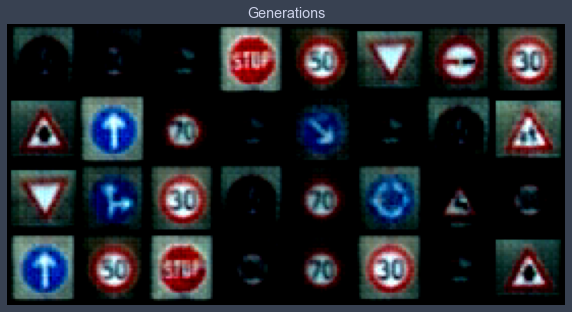

Epoch 51 loss 2158.0187015074634, test L1 = 0.705247912555933
Epoch 52 loss 2158.018557204414, test L1 = 0.6955618970096111
Epoch 53 loss 2158.0179548230776, test L1 = 0.7142714969813824
Epoch 54 loss 2158.0184254859323, test L1 = 0.7104826048016548
Epoch 55 loss 2158.0194683271584, test L1 = 0.7173228748142719
Epoch 56 loss 2158.018436392558, test L1 = 0.708187498152256
Epoch 57 loss 2158.0184917646584, test L1 = 0.7180501371622086
Epoch 58 loss 2158.0174078138425, test L1 = 0.7131256684660912
Epoch 59 loss 2158.018537908076, test L1 = 0.7078200578689575


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 2158.016818856046, test L1 = 0.7233350835740566
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


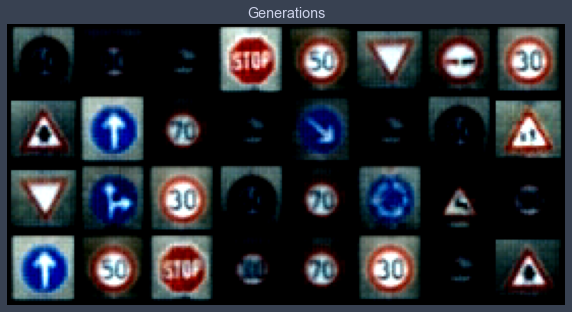

Epoch 61 loss 2158.017276095361, test L1 = 0.7128799743950367
Epoch 62 loss 2158.0159538767184, test L1 = 0.6990212798118591
Epoch 63 loss 2158.0167416706936, test L1 = 0.7041897848248482
Epoch 64 loss 2158.0169849723475, test L1 = 0.7010140754282475
Epoch 65 loss 2499.3605201957153, test L1 = 0.7090635299682617
Epoch 66 loss 2585.64084481046, test L1 = 0.6980203241109848
Epoch 67 loss 2232.784178848529, test L1 = 0.7251793779432774
Epoch 68 loss 2899.3816899565077, test L1 = 0.7077457122504711
Epoch 69 loss 2713.2855899981205, test L1 = 0.7142192833125591


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 2782.1658620932667, test L1 = 0.7344497106969357
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


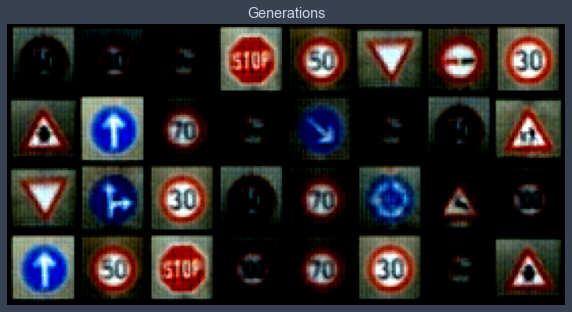

Epoch 71 loss 2809.7069347683096, test L1 = 0.7062538005411625
Epoch 72 loss 2615.8180414049075, test L1 = 0.7132994905114174
Epoch 73 loss 2351.523022209246, test L1 = 0.7160575799643993
Epoch 74 loss 2699.0299697299183, test L1 = 0.7116414234042168
Epoch 75 loss 2796.2961249597292, test L1 = 0.7419456616044044
Epoch 76 loss 2822.059072802567, test L1 = 0.7044835463166237
Epoch 77 loss 2738.905302801493, test L1 = 0.6951941624283791
Epoch 78 loss 2823.3666857952103, test L1 = 0.7044901289045811
Epoch 79 loss 2159.0457356770835, test L1 = 0.7173756323754787


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 2643.253414612865, test L1 = 0.7014308273792267
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


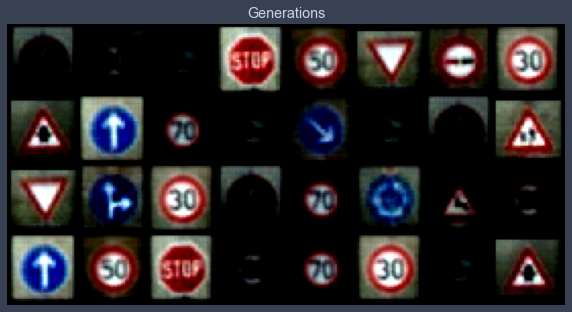







~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=256 | LR=0.001
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 42.351450316275105, test L1 = 0.7486310414969921
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


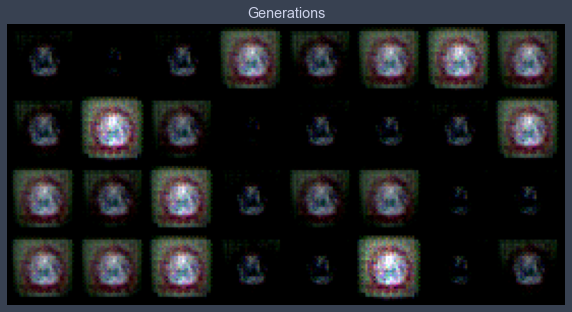

Epoch 1 loss 39242.00223697686, test L1 = 0.7530192248523235
Epoch 2 loss 5716.096292086893, test L1 = 0.735289391130209
Epoch 3 loss 57.54301932423385, test L1 = 0.7384785935282707
Epoch 4 loss 19.303844854184444, test L1 = 0.7311496883630753
Epoch 5 loss 13.19945654795342, test L1 = 0.730259895324707
Epoch 6 loss 7.405149967604896, test L1 = 0.7266730181872845
Epoch 7 loss 4.596201396070395, test L1 = 0.7194873727858067
Epoch 8 loss 4.531155820564716, test L1 = 0.7175640314817429
Epoch 9 loss 3.315049069648756, test L1 = 0.7127068340778351


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 3.2676132962466107, test L1 = 0.7161487564444542
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


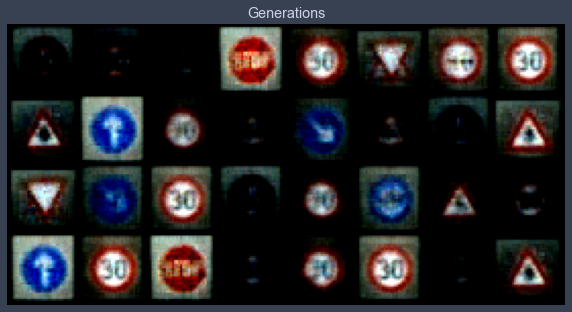

Epoch 11 loss 6.089328360516591, test L1 = 0.707753349095583
Epoch 12 loss 4.088281210140674, test L1 = 0.7118688262999058
Epoch 13 loss 1.65084952423253, test L1 = 0.7168913446366787
Epoch 14 loss 2.6300306969491887, test L1 = 0.715615663677454
Epoch 15 loss 1.5742880282123475, test L1 = 0.7115412466228008
Epoch 16 loss 1.5327540447621821, test L1 = 0.7111302725970745
Epoch 17 loss 1.3686245395145875, test L1 = 0.7118716053664684
Epoch 18 loss 1.2216608911445461, test L1 = 0.7084202542901039
Epoch 19 loss 1.3345050516816759, test L1 = 0.7101865820586681


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 1.1432819087890416, test L1 = 0.7139537781476974
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


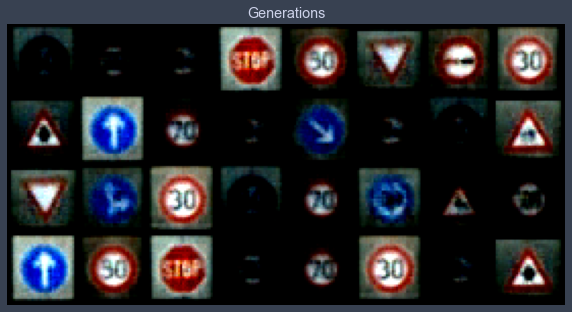

Epoch 21 loss 1.0295999568352585, test L1 = 0.7129359394311905
Epoch 22 loss 0.9739657685519084, test L1 = 0.7127874754369259
Epoch 23 loss 1.2610462109247844, test L1 = 0.7136400789022446
Epoch 24 loss 0.9844878449063121, test L1 = 0.7122707590460777
Epoch 25 loss 1.0312710113541776, test L1 = 0.7138636261224747
Epoch 26 loss 1.6296955273323452, test L1 = 0.7065433599054813
Epoch 27 loss 0.9992678663165299, test L1 = 0.7099180445075035
Epoch 28 loss 1.044612095937696, test L1 = 0.7114919349551201
Epoch 29 loss 0.8690356268096215, test L1 = 0.7113406211137772


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 0.8810958376864797, test L1 = 0.717817846685648
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


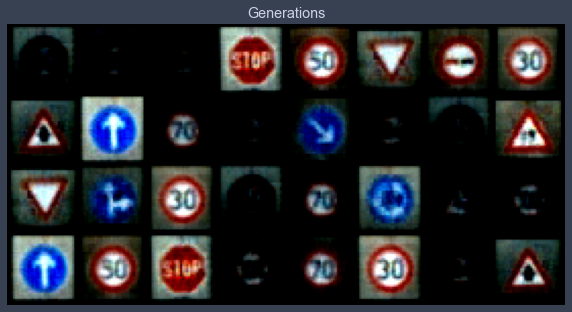

Epoch 31 loss 1.1407603066401792, test L1 = 0.7065357491374016
Epoch 32 loss 1.112808614457186, test L1 = 0.708183292299509
Epoch 33 loss 0.8764833390098257, test L1 = 0.7064630873501301
Epoch 34 loss 0.8645736693926284, test L1 = 0.7027082145214081
Epoch 35 loss 0.8449231334977952, test L1 = 0.7088611498475075
Epoch 36 loss 1.142749133798265, test L1 = 0.7047011107206345
Epoch 37 loss 1.1046991839851301, test L1 = 0.7072855122387409
Epoch 38 loss 0.9292389017200142, test L1 = 0.7105851657688618
Epoch 39 loss 0.8727216945890709, test L1 = 0.7025420032441616


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 0.8637013584887449, test L1 = 0.7161676995456219
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


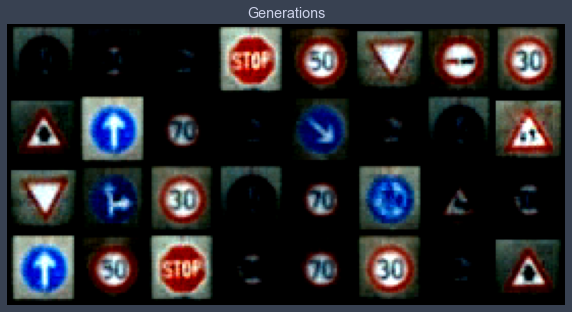

Epoch 41 loss 0.837114744989323, test L1 = 0.7076734192669392
Epoch 42 loss 0.8346317129856122, test L1 = 0.7135198265314102
Epoch 43 loss 0.8868683068613007, test L1 = 0.7050013840198517
Epoch 44 loss 1.0252930204483242, test L1 = 0.7078970968723297
Epoch 45 loss 1.2094679825084726, test L1 = 0.7094117775559425
Epoch 46 loss 0.8412882663130351, test L1 = 0.7072147503495216
Epoch 47 loss 0.8468584770599181, test L1 = 0.7103563696146011
Epoch 48 loss 0.8333982769975957, test L1 = 0.7064748145639896
Epoch 49 loss 0.8335389482606318, test L1 = 0.7115379571914673


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 0.8340041692723933, test L1 = 0.7046923153102398
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


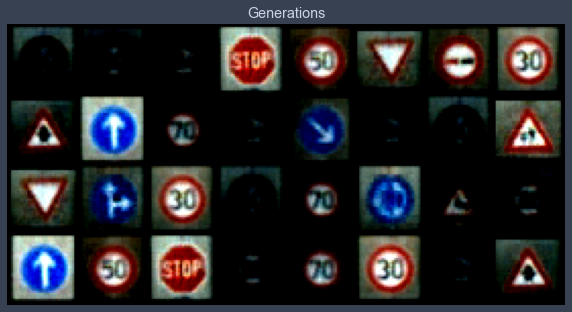

Epoch 51 loss 1.52445004649998, test L1 = 0.7089605890214443
Epoch 52 loss 1.0054724781783586, test L1 = 0.7083721980452538
Epoch 53 loss 0.9963631490661516, test L1 = 0.7044741027057171
Epoch 54 loss 1.191564298577325, test L1 = 0.7037584632635117
Epoch 55 loss 0.8352793440786014, test L1 = 0.7079004868865013
Epoch 56 loss 0.8344673135436278, test L1 = 0.7053279876708984
Epoch 57 loss 0.8324812288136826, test L1 = 0.707371175289154
Epoch 58 loss 0.8321481850958362, test L1 = 0.70835917070508
Epoch 59 loss 0.8325191912372497, test L1 = 0.7043917924165726


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 0.8325491207571784, test L1 = 0.7101409025490284
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


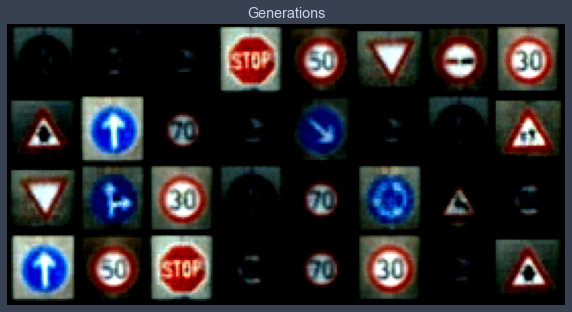

Epoch 61 loss 0.832000171810491, test L1 = 0.702075757086277
Epoch 62 loss 0.8366822753984904, test L1 = 0.7043325453996658
Epoch 63 loss 0.831720954159281, test L1 = 0.7023690678179264
Epoch 64 loss 0.8321313985024941, test L1 = 0.7047207280993462
Epoch 65 loss 0.8362081143044934, test L1 = 0.7055096887052059
Epoch 66 loss 0.8318666070187625, test L1 = 0.7068093605339527
Epoch 67 loss 0.8317440836290314, test L1 = 0.7076603025197983
Epoch 68 loss 0.831998777143734, test L1 = 0.7069301642477512
Epoch 69 loss 0.8325800539292011, test L1 = 0.7039902172982693


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 0.83186409297268, test L1 = 0.7061005495488644
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


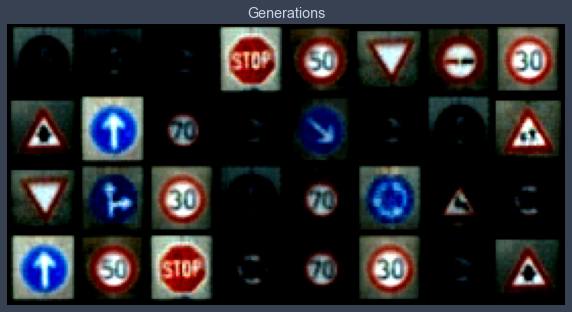

Epoch 71 loss 0.8325842893410385, test L1 = 0.707639429718256
Epoch 72 loss 0.8322804953224471, test L1 = 0.7068852670490742
Epoch 73 loss 0.8320071998330736, test L1 = 0.7095572464168072
Epoch 74 loss 0.8321906322056485, test L1 = 0.7042303383350372
Epoch 75 loss 0.8318903663314086, test L1 = 0.7055885419249535
Epoch 76 loss 0.8317405251702902, test L1 = 0.7079595364630222
Epoch 77 loss 0.8315179864155877, test L1 = 0.7084200233221054
Epoch 78 loss 0.8320315590838796, test L1 = 0.704899363219738
Epoch 79 loss 0.8322722971234534, test L1 = 0.7094050943851471


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 0.8319106837318525, test L1 = 0.7065487280488014
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


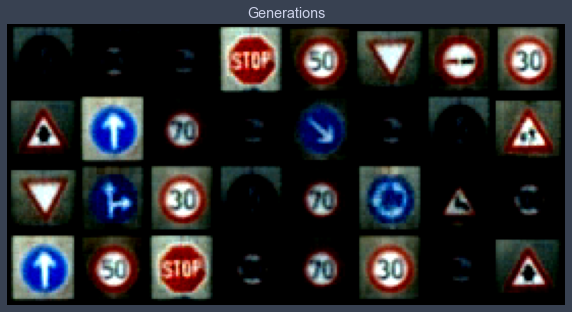







~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=256 | LR=0.01
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 25885315.522886507, test L1 = 0.7223982401192188
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


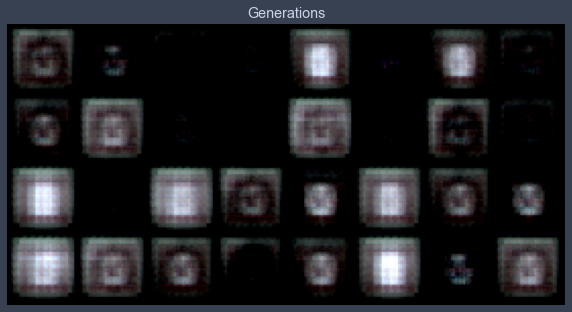

Epoch 1 loss 4394.873519635283, test L1 = 0.7316826656460762
Epoch 2 loss 2273.1268285377737, test L1 = 0.7311523891985416
Epoch 3 loss 1558.076313870879, test L1 = 0.7263771407306194
Epoch 4 loss 1358.9567691763652, test L1 = 0.7185564748942852
Epoch 5 loss 944.9112619616321, test L1 = 0.7054653130471706
Epoch 6 loss 799.4463612664606, test L1 = 0.7189994379878044
Epoch 7 loss 808.5264400731247, test L1 = 0.7109724469482899
Epoch 8 loss 853.3354457317758, test L1 = 0.7160104513168335
Epoch 9 loss 849.1840611683954, test L1 = 0.7068245224654675


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 331.3614006615996, test L1 = 0.7043674737215042
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


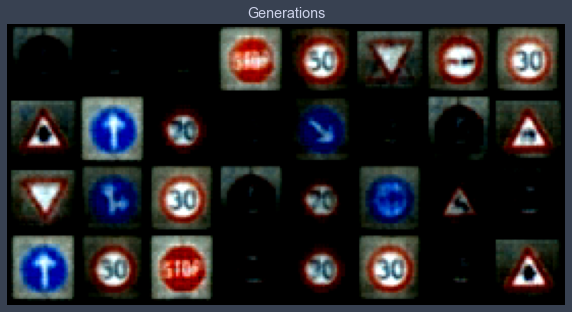

Epoch 11 loss 276.6019327083404, test L1 = 0.7034949436783791
Epoch 12 loss 313.31780097984364, test L1 = 0.708438578993082
Epoch 13 loss 216.20778645272927, test L1 = 0.7020726203918457
Epoch 14 loss 213.21037750391616, test L1 = 0.709931269288063
Epoch 15 loss 222.65069460336287, test L1 = 0.7014839313924313
Epoch 16 loss 108.22406380528847, test L1 = 0.7126329131424427
Epoch 17 loss 80.69225938172684, test L1 = 0.7099926434457302
Epoch 18 loss 65.62111743188805, test L1 = 0.704519234597683
Epoch 19 loss 57.58908814417128, test L1 = 0.7151790894567966


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 60.790769112274, test L1 = 0.7094895578920841
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


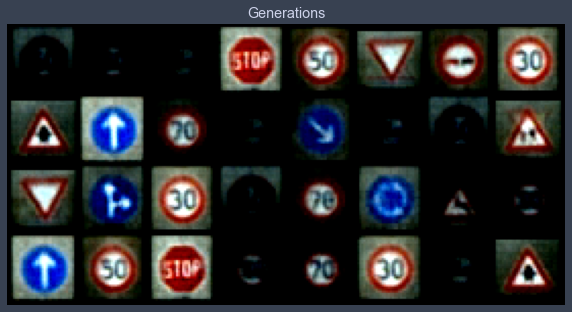

Epoch 21 loss 61.46138326245075, test L1 = 0.7131155766546726
Epoch 22 loss 42.42461585896122, test L1 = 0.7053776904940605
Epoch 23 loss 28.118790309044094, test L1 = 0.7103284746408463
Epoch 24 loss 23.115471338283566, test L1 = 0.7103536128997803
Epoch 25 loss 26.846555525699433, test L1 = 0.7090215794742107
Epoch 26 loss 22.922688069212477, test L1 = 0.7009164541959763
Epoch 27 loss 14.09714122142169, test L1 = 0.7064616531133652
Epoch 28 loss 11.971616086066794, test L1 = 0.7097456492483616
Epoch 29 loss 10.637736646170469, test L1 = 0.7091649062931538


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 7.281090033832694, test L1 = 0.7025503404438496
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


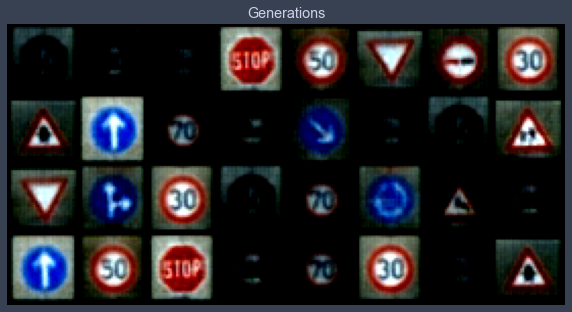

Epoch 31 loss 4.936692810345352, test L1 = 0.7061840891838074
Epoch 32 loss 5.029973201735323, test L1 = 0.7117399945855141
Epoch 33 loss 3.167700961897873, test L1 = 0.7139818966388702
Epoch 34 loss 2.7542372536413446, test L1 = 0.7021525651216507
Epoch 35 loss 2.3256438771883645, test L1 = 0.7124667093157768
Epoch 36 loss 2.312194945885963, test L1 = 0.718308825045824
Epoch 37 loss 1.9273511185678829, test L1 = 0.7144310064613819
Epoch 38 loss 1.396804494546451, test L1 = 0.6998330317437649
Epoch 39 loss 1.4740534101155205, test L1 = 0.7101291492581367


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 1.0507406383445583, test L1 = 0.7089955732226372
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


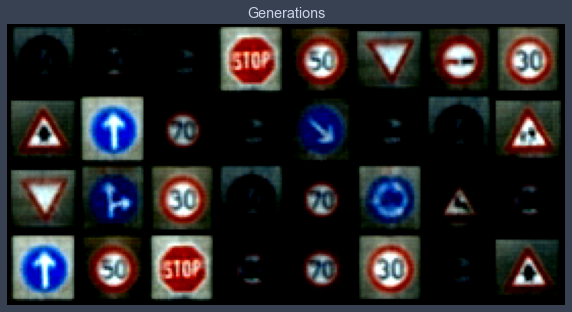

Epoch 41 loss 1.2439354842471093, test L1 = 0.7063770666718483
Epoch 42 loss 0.9761090358508002, test L1 = 0.7096422053873539
Epoch 43 loss 0.955923743469199, test L1 = 0.7083200924098492
Epoch 44 loss 0.9014083161386838, test L1 = 0.716162845492363
Epoch 45 loss 0.8682681672351876, test L1 = 0.7088937982916832
Epoch 46 loss 0.9390813106114102, test L1 = 0.711749691516161
Epoch 47 loss 0.8859780072346586, test L1 = 0.6985651589930058
Epoch 48 loss 0.8494249735910868, test L1 = 0.7099845819175243
Epoch 49 loss 0.8815027606446308, test L1 = 0.7054455019533634


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 0.8353498918084344, test L1 = 0.7069153487682343
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


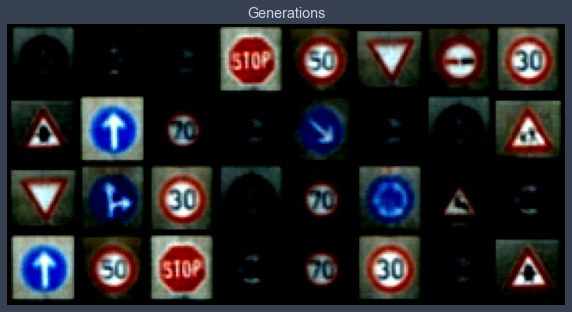

Epoch 51 loss 0.8545829666029546, test L1 = 0.7109409347176552
Epoch 52 loss 5.708502417987155, test L1 = 0.6982767172157764
Epoch 53 loss 1.6223928129550107, test L1 = 0.7000359743833542
Epoch 54 loss 58742678859.61684, test L1 = 0.641862478107214
Epoch 55 loss 1108617.7418116408, test L1 = 0.5922464057803154
Epoch 56 loss 307035.0393175472, test L1 = 0.5743415802717209
Epoch 57 loss 547873.6101401418, test L1 = 0.578350767493248
Epoch 58 loss 152858.44722535438, test L1 = 0.5763689391314983
Epoch 59 loss 83115.30653994845, test L1 = 0.570048701018095


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 77046.60184439433, test L1 = 0.5716979950666428
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


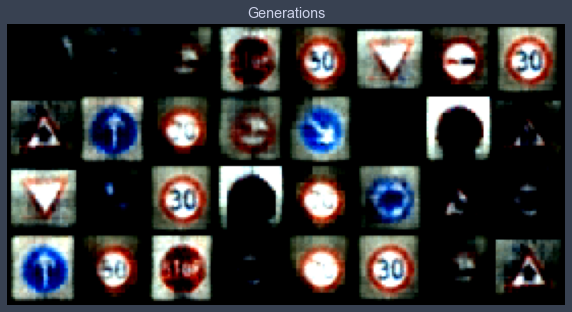

Epoch 61 loss 126195.73209299828, test L1 = 0.5695830620825291
Epoch 62 loss 51655.989818245274, test L1 = 0.5762180387973785
Epoch 63 loss 54106.42659673002, test L1 = 0.5735592469573021
Epoch 64 loss 38905.87145954145, test L1 = 0.5715287104249
Epoch 65 loss 28593.266826406787, test L1 = 0.5733326226472855
Epoch 66 loss 24111.021356851375, test L1 = 0.5736985914409161
Epoch 67 loss 22026.718216414305, test L1 = 0.5724674202501774
Epoch 68 loss 190136.05417908344, test L1 = 0.6002770066261292
Epoch 69 loss 73471.24528833762, test L1 = 0.59760307893157


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 12006.85266323024, test L1 = 0.5896159708499908
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


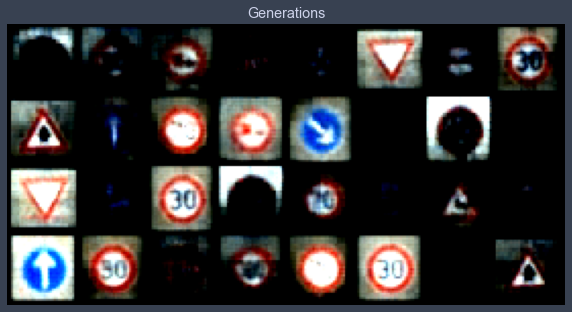

Epoch 71 loss 17749.019960803264, test L1 = 0.60011375695467
Epoch 72 loss 70742.96163049023, test L1 = 0.6041283905506134
Epoch 73 loss 9825.991566661298, test L1 = 0.6146717630326748
Epoch 74 loss 9484.324072769008, test L1 = 0.6171967945992947
Epoch 75 loss 8824.420770913875, test L1 = 0.6254015974700451
Epoch 76 loss 21488.771640423645, test L1 = 0.6173102632164955
Epoch 77 loss 10550.014109817977, test L1 = 0.6402130722999573
Epoch 78 loss 14667.760341159257, test L1 = 0.6462312750518322
Epoch 79 loss 7358.685177727663, test L1 = 0.6500145792961121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 14406.239158813896, test L1 = 0.6568415239453316
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


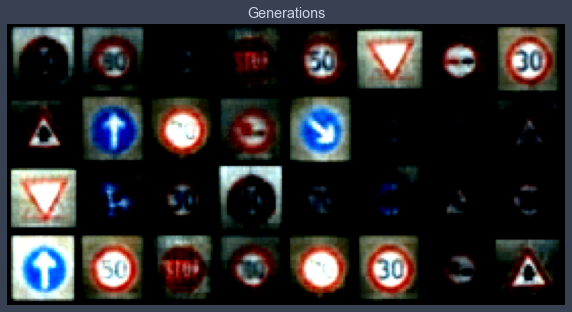







~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
LATENT SIZE=512 | LR=0.1
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 loss 17341723334846.44, test L1 = 0.7739750146865845
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


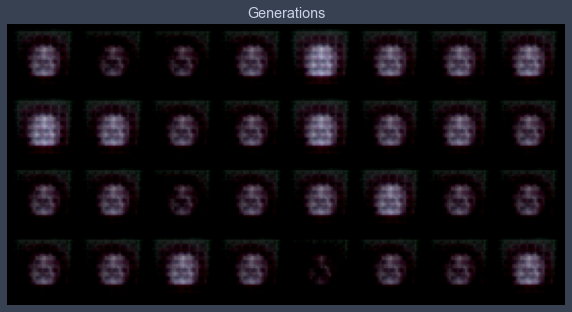

Epoch 1 loss 14447487.709621994, test L1 = 0.7845464758574963
Epoch 2 loss 1909455.300257732, test L1 = 0.7461769469082355
Epoch 3 loss 883536.8159901203, test L1 = 0.7496247328817844
Epoch 4 loss 1183473.929070017, test L1 = 0.7187077887356281
Epoch 5 loss 3296535.7916129725, test L1 = 0.7332172654569149
Epoch 6 loss 410814.94754080754, test L1 = 0.7215083129703999
Epoch 7 loss 3917198.505369416, test L1 = 0.7374701090157032
Epoch 8 loss 211006.16676063143, test L1 = 0.7269224375486374
Epoch 9 loss 175264.87929553265, test L1 = 0.7030034065246582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 10 loss 177266.2148169029, test L1 = 0.7298484891653061
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


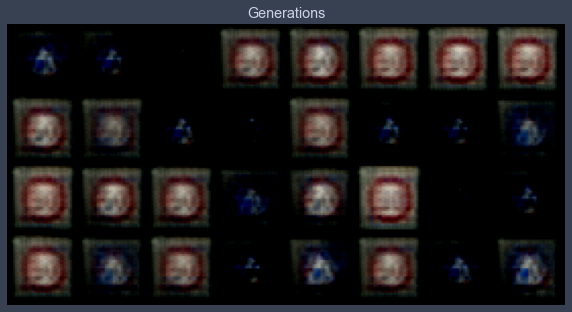

Epoch 11 loss 43255.73755637887, test L1 = 0.7172367684543133
Epoch 12 loss 72866.48309305198, test L1 = 0.752181988209486
Epoch 13 loss 62819.94850059064, test L1 = 0.7445239871740341
Epoch 14 loss 3789903.0521907215, test L1 = 0.7193897888064384
Epoch 15 loss 339428.3615630369, test L1 = 0.7250410728156567
Epoch 16 loss 22657.53844501718, test L1 = 0.7277633622288704
Epoch 17 loss 22235.874926170534, test L1 = 0.738606832921505
Epoch 18 loss 22066.319929929123, test L1 = 0.7236543633043766
Epoch 19 loss 20040.25727555842, test L1 = 0.7328641898930073


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 loss 44170.28104864691, test L1 = 0.7089319564402103
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


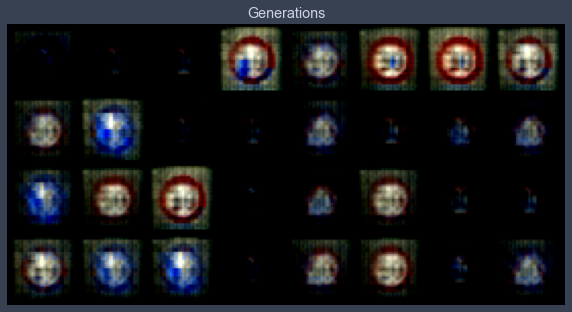

Epoch 21 loss 17920.604784149484, test L1 = 0.7386188618838787
Epoch 22 loss 17661.90521638746, test L1 = 0.7181379161775112
Epoch 23 loss 17280.783276954466, test L1 = 0.7296114563941956
Epoch 24 loss 17007.278390786083, test L1 = 0.7364208474755287
Epoch 25 loss 18346.165431701033, test L1 = 0.7289121858775616
Epoch 26 loss 16634.753295478953, test L1 = 0.7041210904717445
Epoch 27 loss 17190.479723743556, test L1 = 0.699378278106451
Epoch 28 loss 16461.305372100516, test L1 = 0.693679466843605
Epoch 29 loss 16343.113328232388, test L1 = 0.7244622483849525


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 30 loss 16296.673291183419, test L1 = 0.7317524924874306
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


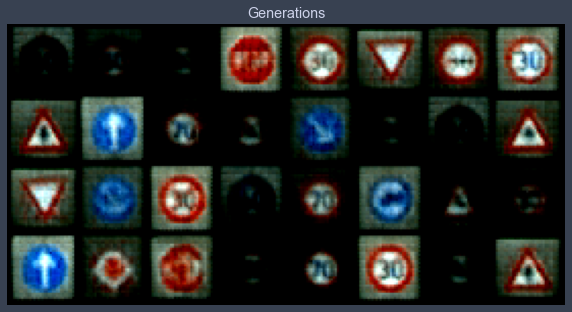

Epoch 31 loss 16266.60103227019, test L1 = 0.7165589742362499
Epoch 32 loss 16248.17624100623, test L1 = 0.7401251345872879
Epoch 33 loss 16248.662455031143, test L1 = 0.6945350505411625
Epoch 34 loss 16231.795596407861, test L1 = 0.7479469962418079
Epoch 35 loss 16228.907166156572, test L1 = 0.7216943949460983
Epoch 36 loss 16227.576957152061, test L1 = 0.6841927170753479
Epoch 37 loss 16227.017108301117, test L1 = 0.7112552560865879
Epoch 38 loss 16226.805221085697, test L1 = 0.7297736331820488
Epoch 39 loss 16226.735536136168, test L1 = 0.7187697403132915


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 loss 16278.41437124141, test L1 = 0.7141245380043983
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


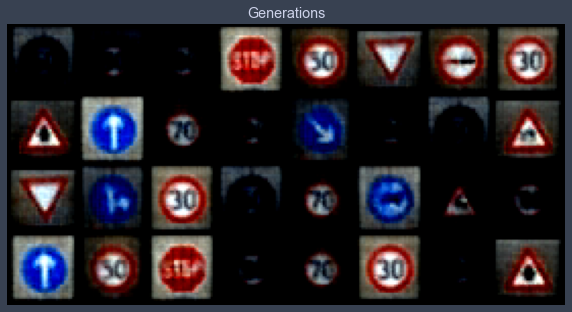

Epoch 41 loss 16226.709578366625, test L1 = 0.7088491953909397
Epoch 42 loss 16226.707095011812, test L1 = 0.6959746740758419
Epoch 43 loss 16226.706433902491, test L1 = 0.699280422180891
Epoch 44 loss 16226.708014524269, test L1 = 0.6845596916973591
Epoch 45 loss 16226.706430546606, test L1 = 0.6939840838313103
Epoch 46 loss 16226.706215769975, test L1 = 0.7196811437606812
Epoch 47 loss 16226.704208950816, test L1 = 0.7116567008197308
Epoch 48 loss 16227.122815318944, test L1 = 0.7394476942718029
Epoch 49 loss 16226.704094850731, test L1 = 0.6973583810031414


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 50 loss 16259.527498120704, test L1 = 0.6960049495100975
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


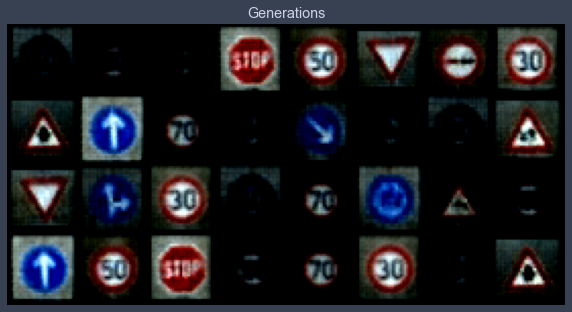

Epoch 51 loss 25769.262571144758, test L1 = 0.7036851681768894
Epoch 52 loss 16276.420119872208, test L1 = 0.7222884818911552
Epoch 53 loss 16226.703125, test L1 = 0.71314712241292
Epoch 54 loss 16226.703376691366, test L1 = 0.7260548584163189
Epoch 55 loss 16226.702494093643, test L1 = 0.7202720306813717
Epoch 56 loss 16223.371785062285, test L1 = 0.7069607377052307
Epoch 57 loss 16204.27594770189, test L1 = 0.7195621877908707
Epoch 58 loss 16204.278498174399, test L1 = 0.7265718318521976
Epoch 59 loss 16205.646158854166, test L1 = 0.7029784992337227


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 loss 17438.877990093428, test L1 = 0.7242489606142044
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


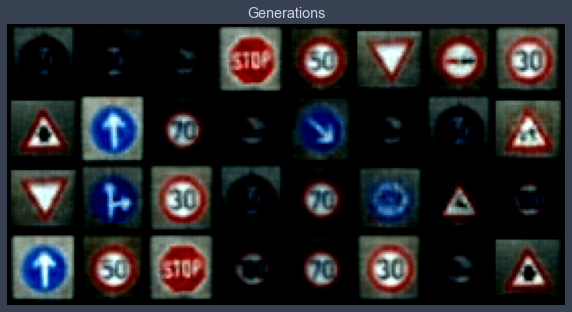

Epoch 61 loss 17999.155152625644, test L1 = 0.6889427006244659
Epoch 62 loss 16302.99416747208, test L1 = 0.7094749175012112
Epoch 63 loss 19810.102193406357, test L1 = 0.7103708200156689
Epoch 64 loss 16740.01155431164, test L1 = 0.7357917316257954
Epoch 65 loss 18209.971532028565, test L1 = 0.6926001235842705
Epoch 66 loss 18179.86242214347, test L1 = 0.7183859273791313
Epoch 67 loss 19664.13852757195, test L1 = 0.7043687105178833
Epoch 68 loss 18567.11667069373, test L1 = 0.7003660537302494
Epoch 69 loss 18677.943725166453, test L1 = 0.7186903394758701


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 loss 18784.33538713488, test L1 = 0.7170367687940598
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


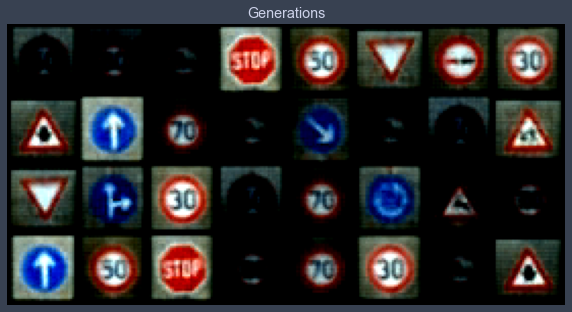

Epoch 71 loss 16217.9501953125, test L1 = 0.7250572517514229
Epoch 72 loss 23194.82454762672, test L1 = 0.7032879777252674
Epoch 73 loss 16204.273071708549, test L1 = 0.7231713719666004
Epoch 74 loss 20198.336793250644, test L1 = 0.7016702480614185
Epoch 75 loss 16300.765151820233, test L1 = 0.745768066495657
Epoch 76 loss 19776.922861630155, test L1 = 0.70853266492486
Epoch 77 loss 16206.351877953179, test L1 = 0.7041226923465729
Epoch 78 loss 17585.375040270617, test L1 = 0.6986532956361771
Epoch 79 loss 18258.787777196092, test L1 = 0.70744738727808


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 loss 17878.76549412049, test L1 = 0.7374943979084492
test_fixed_labels=tensor([ 3,  5, 10, 14,  2, 13,  9,  1, 11, 35,  4, 10, 38, 10,  3, 28, 13, 36,
         1,  3,  4, 40, 31,  7, 35,  2, 14,  7,  4,  1, 10, 11],
       device='cuda:0')


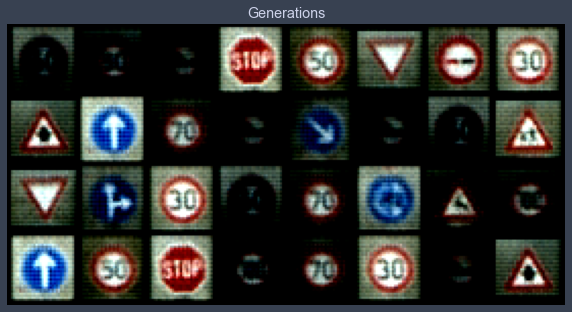

In [34]:
validate_models = []
for val_latent_size, val_lr in h_params:
    val_signs_vae = SignsVAE(latent_dim=val_latent_size, classess_size=N_OF_CLASSESS).to(device)
    val_optimizer = optim.Adam(val_signs_vae.parameters(), lr=val_lr)
    val_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=val_optimizer, gamma=0.99)
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    print(f"LATENT SIZE={val_latent_size} | LR={val_lr}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

    validate_vae_training(vae_model=val_signs_vae, vae_optimizer=val_optimizer, vae_train_loader=train_loader,
                              vae_valid_loader=valid_loader, vae_scheduler=val_scheduler,
                              test_fixed_noise=val_fixed_noise, test_fixed_labels_one_hot=val_fixed_labels_one_hot,
                              test_fixed_labels=val_fixed_labels, latent_size=val_latent_size, num_epochs=81)

    print("\n" * 5)
    state_dict = val_signs_vae.state_dict()
    torch.save(state_dict, f"models/lat{val_latent_size}_lr{val_lr}.tar")
    validate_models.append(val_signs_vae)

## Przykładowe wyniki

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


~~~~~~~~LATENT=128~~LR=0.001~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


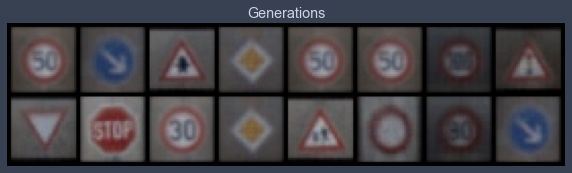

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~LATENT=64~~LR=0.01~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


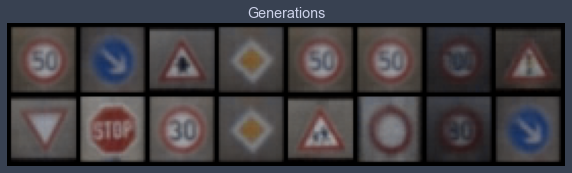

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~LATENT=64~~LR=0.001~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


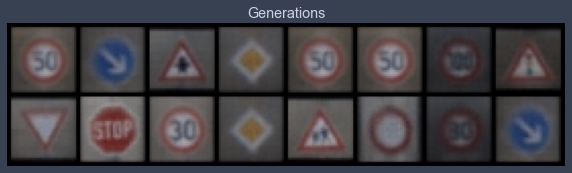

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~LATENT=64~~LR=0.1~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


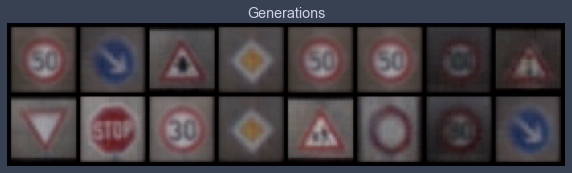

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~LATENT=256~~LR=0.001~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


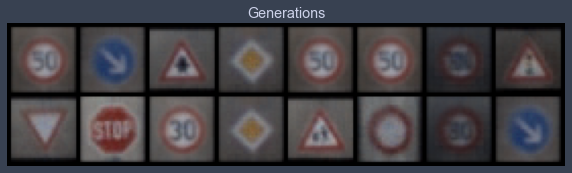

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~LATENT=256~~LR=0.01~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


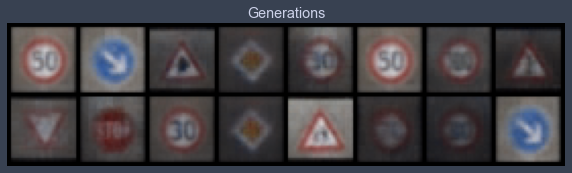

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
~~~~~~~~LATENT=512~~LR=0.1~~~~~~
test_fixed_labels=tensor([ 2, 38, 11, 12,  2,  2,  7, 26, 13, 14,  1, 12, 28, 15,  5, 38],
       device='cuda:0')


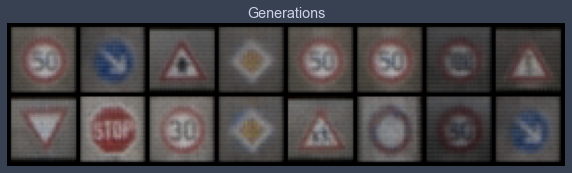

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [38]:
test_fixed_noise = torch.randn(16, 512, device=device)
test_fixed_labels = next(iter(train_loader))[1]
test_fixed_labels = test_fixed_labels[:16].to(device)
test_fixed_labels_one_hot = Functional.one_hot(test_fixed_labels, N_OF_CLASSESS).float()
with torch.no_grad():
    for hiper_params, val_model in zip(h_params, validate_models):
        print(f"~~~~~~~~LATENT={hiper_params[0]}~~LR={hiper_params[1]}~~~~~~")
        print(f"{test_fixed_labels=}")
        fake_gens = val_model.decoder(test_fixed_noise[:, :hiper_params[0]], test_fixed_labels_one_hot).detach().cpu()
        fake_gens = denormalize(fake_gens)
        grid = torchvision.utils.make_grid(fake_gens)
        grid = grid.permute(1, 2, 0)
        plt.figure(figsize=(10,10))
        plt.title(f"Generations")
        plt.imshow(grid)
        plt.axis('off')
        plt.show()
        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

## Porownanie miary FID dla tych modeli:

In [23]:
from inception import InceptionV3
dims = 2048
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]
inc_model = InceptionV3([block_idx])

In [24]:
import numpy as np
from scipy import linalg


def calculate_frechet_distance(distribution_1, distribution_2, eps=1e-6):
    mu1 = np.mean(distribution_1, axis=0)
    sigma1 = np.cov(distribution_1, rowvar=False)

    mu2 = np.mean(distribution_2, axis=0)
    sigma2 = np.cov(distribution_2, rowvar=False)

    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    Stable version by Dougal J. Sutherland.
    Params:
    -- mu1   : Numpy array containing the activations of a layer of the
               inception net (like returned by the function 'get_predictions')
               for generated samples.
    -- mu2   : The sample mean over activations, precalculated on an
               representative data set.
    -- sigma1: The covariance matrix over activations for generated samples.
    -- sigma2: The covariance matrix over activations, precalculated on an
               representative data set.
    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, 'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape,'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    # Product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

Liczona dystrybucja dla 1024 elementów ze zbioru treningowego.

In [25]:
not_normalized_loader = torch.utils.data.DataLoader(dataset_not_normalized, batch_size=128, shuffle=True)

In [ ]:
pred_arr = np.empty((1024, dims))
start_idx = 0
i = 0
for batch, _  in iter(not_normalized_loader):
    batch = batch.cpu()
    with torch.no_grad():
        pred = inc_model(batch)[0]
        pred = pred.squeeze(3).squeeze(2).cpu().numpy()
    pred_arr[start_idx:start_idx + pred.shape[0]] = pred
    print(f"batch no: {i}")
    if i == 7:
        break
    i += 1

pred_arr

Zebranie rozkładu klas ze zbioru trenującego

In [30]:
N_OF_CLASSESS = numb_classess

In [31]:
N_OF_CLASSESS

43

In [32]:
# validate_models = []
# for hiper_p in h_params:
#     temp_state_dict = torch.load(f"models/lat{hiper_p[0]}_lr{hiper_p[1]}.tar")
#     temp_mod = SignsVAE(latent_dim=hiper_p[0], classess_size=N_OF_CLASSESS).to(device)
#     temp_mod.load_state_dict(temp_state_dict)
#     validate_models.append(temp_mod)


In [33]:
classes = [label for _, label in full_dataset]
classes_amount = Counter(classes)
classes_amount = dict(classes_amount)
sample_classes_amount = {}

In [34]:
for key in classes_amount.keys():
    sample_classes_amount[key] = round((classes_amount[key] * 1000) / len(full_dataset))
sample_classes_amount[13] += 1
sum(sample_classes_amount.values())

1000

In [35]:
N_OF_IMAGES = 1000

Policzenie miary

In [ ]:
fids = []
with torch.no_grad():
    fid_fixed_noise = torch.randn(1000, 512, device=device)
    fid_fixed_labels = torch.empty(0, dtype=torch.int64)
    for fid_key, fid_value in sample_classes_amount.items():
        fid_temp_tens = torch.LongTensor([fid_key for _ in range(fid_value)])
        fid_fixed_labels = torch.cat([fid_fixed_labels, fid_temp_tens], dim=0)
    fid_fixed_labels = fid_fixed_labels.to(device)
    fid_fixed_labels_one_hot = Functional.one_hot(fid_fixed_labels, N_OF_CLASSESS).float()

    for fid_hiper_params, fid_val_model in zip(h_params, validate_models):
        print(f"~~~~~~~~LATENT={fid_hiper_params[0]}~~LR={fid_hiper_params[1]}~~~~~~")
        fid_latent_size = fid_hiper_params[0]
        fid_new_images = fid_val_model.decoder(fid_fixed_noise[:, :fid_latent_size], fid_fixed_labels_one_hot).detach().cpu()
        fid_new_images = denormalize(fid_new_images)
        print(fid_new_images.size())
        # torch.save(fid_new_images.cpu().detach(), f"output_pt/latent_{fid_hiper_params[0]}lr_{fid_hiper_params[1]}.pt")
        # generated_dist = inc_model(fid_new_images)[0]
        # fid = calculate_frechet_distance(pred_arr.squeeze(), generated_dist.squeeze().numpy())
        # print(f"FID={fid}")
        # fids.append(fid)
        print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

Nie zdazylismy policzyc, na podstawie generacji uznalismy ze najlepszy jest model z latent_space=64 i lr=0.01.